## LARIS on human tonsil Slide-tags data, inference and visualization

### Import LARIS

In [1]:
path = '/data1/mdai/Analysis/Jupyter/Python/Package/LARIS'
import sys
sys.path.append(path)
import laris as la

### Import other packages

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
sc.set_figure_params(dpi=96,dpi_save=300, color_map='viridis',facecolor='white')
plt.rcParams['figure.figsize'] = 4, 4
sc.settings.verbosity = 3
sc.logging.print_header()

scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.26.2 scipy==1.11.4 pandas==2.1.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.11.3 louvain==0.8.1 pynndescent==0.5.11


In [4]:
# Colours
from matplotlib import cm
from matplotlib import colors, colorbar
cmap_own = cm.get_cmap('magma_r', 256)
newcolors = cmap_own(np.linspace(0,0.75 , 256))
Greys = cm.get_cmap('Greys_r', 256)
#newcolors[:1, :] = Greys(np.linspace(0.8125, 0.8725, 1))
newcolors[:10, :] = Greys(np.linspace(0.8125, 0.8725, 10))
pos_cmap = colors.ListedColormap(newcolors)

/tmp/ipykernel_3278614/2129373808.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_own = cm.get_cmap('magma_r', 256)
/tmp/ipykernel_3278614/2129373808.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  Greys = cm.get_cmap('Greys_r', 256)


### Load data

```
mkdir -p /data1/mdai/Result/single-cell/Methods/LARIS/tutorial
cd /data1/mdai/Result/single-cell/Methods/LARIS/tutorial
gdrive files download 170cY6MjzUlOyaHlHq-N8_vqgKKPwQ_8N
```

In [5]:
adata=sc.read('/data1/mdai/Result/single-cell/Methods/LARIS/tutorial/adata_tonsil.h5ad') # Read in the anndata object

In [6]:
adata

AnnData object with n_obs × n_vars = 5695 × 25583
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'cell_type', 'region_name'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'var_across_cell_types'
    uns: 'cell_type_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'region_name_colors', 'umap'
    obsm: 'X_pca', 'X_spatial', 'X_umap'
    varm: 'PCs'
    layers: 'CellBender_raw_X'
    obsp: 'connectivities', 'distances'

/data1/mdai/.conda/envs/scda/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


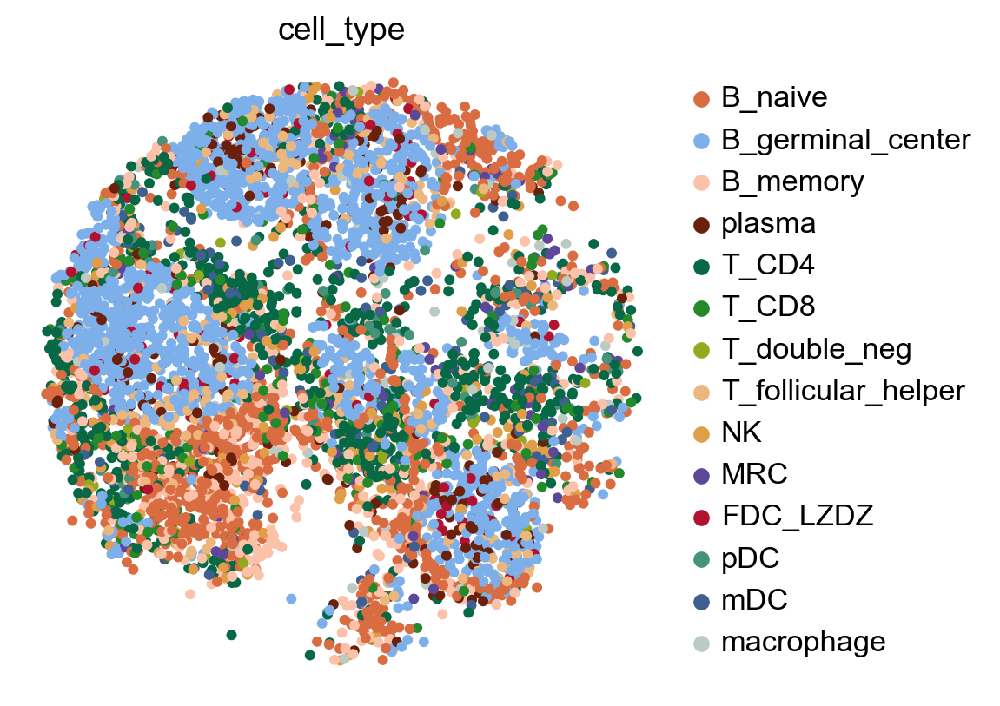

In [7]:
# Check spatial mapping
x_width=adata.obsm['X_spatial'][:,0].max()-adata.obsm['X_spatial'][:,0].min()
y_width=adata.obsm['X_spatial'][:,1].max()-adata.obsm['X_spatial'][:,1].min()

plt.rcParams['figure.figsize'] = 5, 5*y_width/x_width

sc.pl.embedding(
    adata,
    basis='X_spatial',
    color=['cell_type'],
    size=80,frameon=False)

plt.rcParams['figure.figsize'] = 4, 4

/data1/mdai/.conda/envs/scda/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


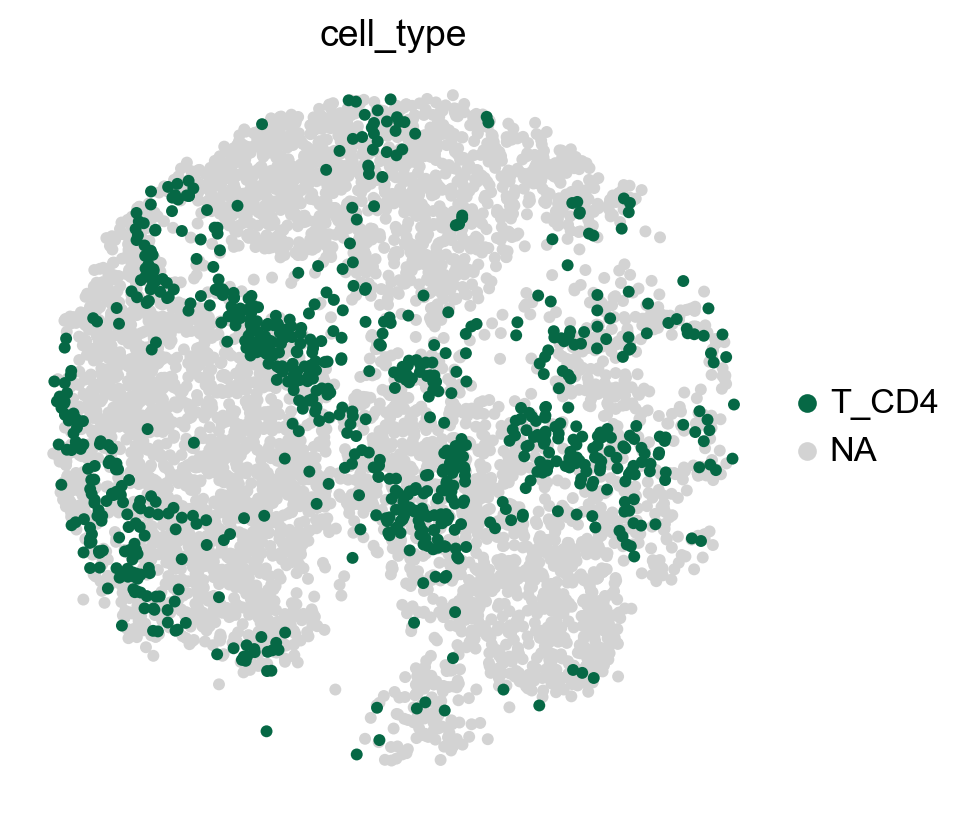

In [8]:
# Check spatial mapping
x_width=adata.obsm['X_spatial'][:,0].max()-adata.obsm['X_spatial'][:,0].min()
y_width=adata.obsm['X_spatial'][:,1].max()-adata.obsm['X_spatial'][:,1].min()

plt.rcParams['figure.figsize'] = 5, 5*y_width/x_width

sc.pl.embedding(
    adata,
    basis='X_spatial',
    color=['cell_type'],
    groups=['T_CD4'],
    size=80,frameon=False)

plt.rcParams['figure.figsize'] = 4, 4

/data1/mdai/.conda/envs/scda/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


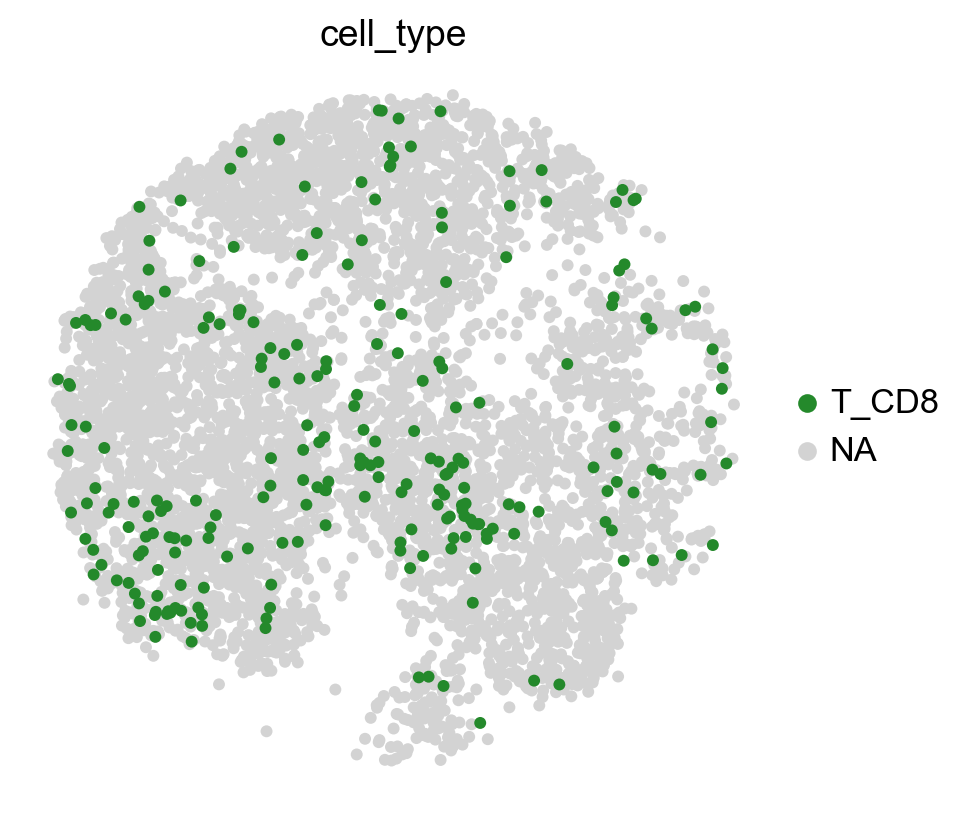

In [9]:
# Check spatial mapping
x_width=adata.obsm['X_spatial'][:,0].max()-adata.obsm['X_spatial'][:,0].min()
y_width=adata.obsm['X_spatial'][:,1].max()-adata.obsm['X_spatial'][:,1].min()

plt.rcParams['figure.figsize'] = 5, 5*y_width/x_width

sc.pl.embedding(
    adata,
    basis='X_spatial',
    color=['cell_type'],
    groups=['T_CD8'],
    size=80,frameon=False)

plt.rcParams['figure.figsize'] = 4, 4

/data1/mdai/.conda/envs/scda/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


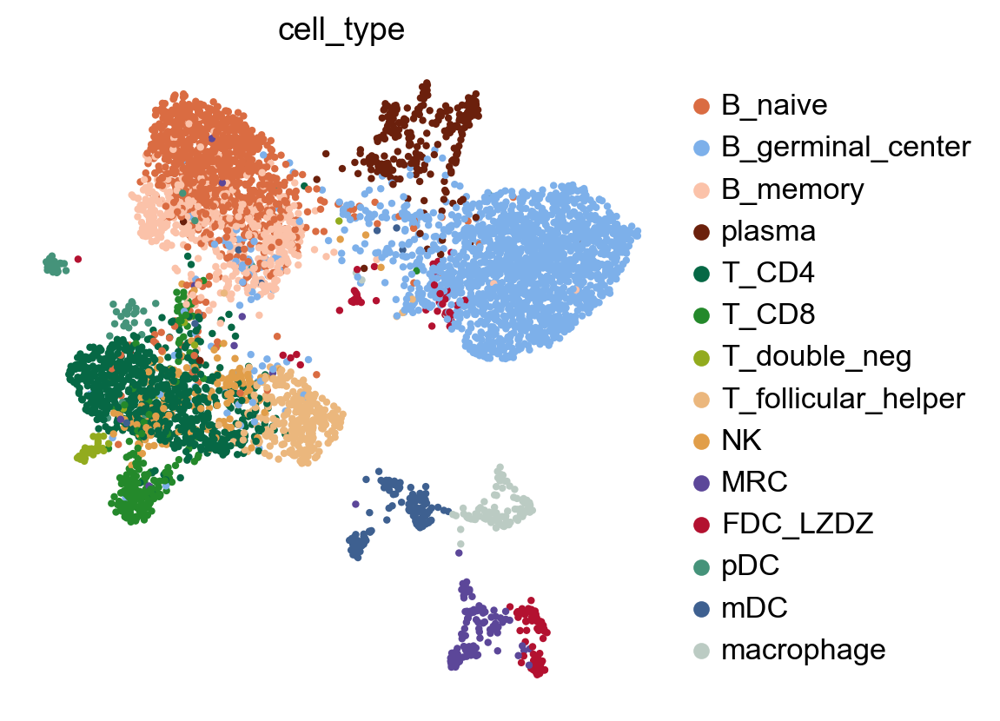

In [10]:
# Check spatial UMAP
x_width=adata.obsm['X_umap'][:,0].max()-adata.obsm['X_umap'][:,0].min()
y_width=adata.obsm['X_umap'][:,1].max()-adata.obsm['X_umap'][:,1].min()

plt.rcParams['figure.figsize'] = 5, 5*y_width/x_width

sc.pl.embedding(
    adata,
    basis='X_umap',
    color=['cell_type'],
    size=40,frameon=False)

plt.rcParams['figure.figsize'] = 4, 4

### Run LARIS

#### Load the cell-cell interaction database

In [11]:
%%time
# Any dataframe could be used as long as 'ligand' and 'receptor' coloumns exist
lr_df=pd.read_csv('/data1/mdai/Result/single-cell/Methods/LARIS/tutorial/human_lr_database_CellChatDB_formatted_v2.csv',index_col=0)

CPU times: user 55 ms, sys: 3.55 ms, total: 58.5 ms
Wall time: 57.4 ms


In [12]:
lr_df.head()

,pathway_name,ligand,receptor,agonist,antagonist,co_A_receptor,co_I_receptor,evidence,annotation,interaction_name_2,...,receptor.symbol,receptor.family,receptor.location,receptor.keyword,receptor.surfaceome_main,receptor.surfaceome_sub,receptor.adhesome,receptor.secreted_type,receptor.transmembrane,version
interaction_name,,,,,,,,,,,,,,,,,,,,,
TGFB1_TGFBR1_TGFBR2,TGFb,TGFB1,TGFBR2,TGFb agonist,TGFb antagonist,NaN,TGFb inhibition receptor,KEGG: hsa04350,Secreted Signaling,TGFB1 - (TGFBR1+TGFBR2),...,"TGFBR2, TGFBR1","Protein kinase superfamily, TKL Ser/Thr protei...","Cell membrane, Secreted, Membrane raft, Cell s...","Membrane, Secreted, Disulfide bond, Kinase, Tr...",Receptors,Act.TGFB;Kinase,NaN,NaN,True,CellChatDB v1
TGFB1_TGFBR1_TGFBR2,TGFb,TGFB1,TGFBR1,TGFb agonist,TGFb antagonist,NaN,TGFb inhibition receptor,KEGG: hsa04350,Secreted Signaling,TGFB1 - (TGFBR1+TGFBR2),...,"TGFBR2, TGFBR1","Protein kinase superfamily, TKL Ser/Thr protei...","Cell membrane, Secreted, Membrane raft, Cell s...","Membrane, Secreted, Disulfide bond, Kinase, Tr...",Receptors,Act.TGFB;Kinase,NaN,NaN,True,CellChatDB v1
TGFB2_TGFBR1_TGFBR2,TGFb,TGFB2,TGFBR2,TGFb agonist,TGFb antagonist,NaN,TGFb inhibition receptor,KEGG: hsa04350,Secreted Signaling,TGFB2 - (TGFBR1+TGFBR2),...,"TGFBR2, TGFBR1","Protein kinase superfamily, TKL Ser/Thr protei...","Cell membrane, Secreted, Membrane raft, Cell s...","Membrane, Secreted, Disulfide bond, Kinase, Tr...",Receptors,Act.TGFB;Kinase,NaN,NaN,True,CellChatDB v1
TGFB2_TGFBR1_TGFBR2,TGFb,TGFB2,TGFBR1,TGFb agonist,TGFb antagonist,NaN,TGFb inhibition receptor,KEGG: hsa04350,Secreted Signaling,TGFB2 - (TGFBR1+TGFBR2),...,"TGFBR2, TGFBR1","Protein kinase superfamily, TKL Ser/Thr protei...","Cell membrane, Secreted, Membrane raft, Cell s...","Membrane, Secreted, Disulfide bond, Kinase, Tr...",Receptors,Act.TGFB;Kinase,NaN,NaN,True,CellChatDB v1
TGFB3_TGFBR1_TGFBR2,TGFb,TGFB3,TGFBR2,TGFb agonist,TGFb antagonist,NaN,TGFb inhibition receptor,KEGG: hsa04350,Secreted Signaling,TGFB3 - (TGFBR1+TGFBR2),...,"TGFBR2, TGFBR1","Protein kinase superfamily, TKL Ser/Thr protei...","Cell membrane, Secreted, Membrane raft, Cell s...","Membrane, Secreted, Disulfide bond, Kinase, Tr...",Receptors,Act.TGFB;Kinase,NaN,NaN,True,CellChatDB v1


#### Remove ligand and receptors not present in the object

In [13]:
rows_keep=np.logical_and( lr_df['ligand'].isin(adata.var_names), lr_df['receptor'].isin(adata.var_names) )

In [14]:
lr_df=lr_df.loc[rows_keep].copy()

### Create the ligand-receptor anndata object

In [15]:
%%time
lr_adata=la.tl.prepareLRInteraction(
    adata, # object used to construt the LR object
    lr_df, # dataframe to use for interactions
    number_nearest_neighbors=20,
    use_rep_spatial='X_spatial'
)

CPU times: user 2.41 s, sys: 168 ms, total: 2.58 s
Wall time: 2.58 s


### Run LARIS

To:
1. identify spatially variable and specific ligand-receptor interactions
2. infer the interation directionality at cell type level if `by_celltype` set to `True`

In [16]:
%%time
import warnings
warnings.filterwarnings("ignore")
LARIS_variable_interactions, res_LARIS=la.tl.runLARIS(
    lr_adata,
    adata,
    use_rep='X_spatial',
    n_nearest_neighbors=20,
    random_seed=27,
    n_repeats=5,
    mu = 0.40, # larger value indicates more consideration for specificity
    sigma=100,
    remove_lowly_expressed=False,
    expressed_pct=0.1,
    n_cells_expressed_threshold=100,
    n_top_lr=lr_adata.shape[1],
    
    by_celltype=True,
    ### Parameters for cell type-level inference when by_celltype set to True
    groupby='cell_type', # label to group by
    use_rep_spatial='X_spatial', # spatial coordinates
    mu_celltype=100, # higher value puts more emphasis on cell type specificity
    expressed_pct_celltype=0.1, # expression percentage cut off per cell type
    remove_lowly_expressed_celltype=False,
    mask_threshold=1e-6, # mask for cosg, lower value is less restrictive
    n_neighbors_permutation=30,
    score_threshold= 1e-10,
    spatial_weight = 3.0,
)


LARIS ANALYSIS

Input data: 5695 cells × 1985 LR pairs
Mode: Cell type-specific analysis

--- Step 1: Calculating spatial specificity scores ---
  - Using 20 nearest neighbors
  - Regularization parameter μ = 0.4
  - Random repeats: 5
  - Generating random permutations...
  ✓ Identified 1985 top spatially-specific LR pairs
  - Score range: [-0.0431, 0.6720]

CELL TYPE-SPECIFIC ANALYSIS

Analyzing 14 cell types from 'cell_type'
Cell types: ['B_germinal_center', 'B_memory', 'B_naive', 'FDC_LZDZ', 'MRC', 'NK', 'T_CD4', 'T_CD8', 'T_double_neg', 'T_follicular_helper']...

LARIS CELL TYPE ANALYSIS

--- Step 1: Calculating ligand and receptor cell type specificity ---
  ✓ Computed specificity for 962 genes across 14 cell types

--- Step 2: Calculating diffused LR-score distribution ---
  ✓ Computed diffused scores for 1985 interactions

--- Step 3: Computing interaction scores (spatial_weight=3.0) ---
  ✓ Processed 1985 interactions

--- Step 3.5: Rescaling interaction scores ---
  - Scaling

  Processing pairs:   0%|          | 0/196 [00:00<?, ?it/s]

  ✓ Calculated p-values for 389,060 interaction combinations

--- Step 5.3: Applying FDR correction (Benjamini-Hochberg) ---
  - Strategy: Pre-filtered
  - Pre-filter threshold: 0.0


  FDR correction:   0%|          | 0/196 [00:00<?, ?it/s]

  ✓ Corrected 196 sender-receiver pairs
  - Interactions tested: 49,392
  - Interactions filtered: 339,668

  Significant interactions:
  - FDR < 0.05: 4,498 (1.16%)
  - FDR < 0.01: 1,700 (0.44%)

STATISTICAL TESTING COMPLETE

LARIS CELL TYPE ANALYSIS COMPLETE

Final results: 389,060 sender-receiver-LR combinations
Score range: [0.000000, 0.900057]

ANALYSIS COMPLETE

Results summary:
  - Spatially-specific LR pairs: 1985
  - Cell type combinations: 389,060
  - Significant interactions (FDR < 0.05): 4,498
CPU times: user 2min 20s, sys: 268 ms, total: 2min 20s
Wall time: 2min 20s


#### Check the spatial variable LR interaction

In [17]:
LARIS_variable_interactions.shape

(1985, 4)

In [18]:
res_LARIS.shape

(389060, 9)

In [19]:
LARIS_variable_interactions.head(10)

,ligand,receptor,score,Rank
SEMA4A::PLXNA4,SEMA4A,PLXNA4,0.671992,0
LAMB1::CD44,LAMB1,CD44,0.670729,1
FCER2::CR2,FCER2,CR2,0.658593,2
APP::CD74,APP,CD74,0.658068,3
PTPRC::MRC1,PTPRC,MRC1,0.654901,4
PTPRC::CD22,PTPRC,CD22,0.641263,5
LAMB3::CD44,LAMB3,CD44,0.638657,6
SEMA4D::PLXNB1,SEMA4D,PLXNB1,0.635213,7
COL4A1::CD44,COL4A1,CD44,0.634731,8
IL4::IL4R,IL4,IL4R,0.633580,9


In [20]:
res_LARIS.head()

,sender,receiver,interaction_score,ligand,receptor,interaction_name,p_value,p_value_fdr,nlog10_p_value_fdr
0,B_naive,B_naive,0.900057,FCER2,CR2,FCER2::CR2,0.000999,0.010570,1.975922
1,B_memory,B_memory,0.538235,COL4A3,CD44,COL4A3::CD44,0.000999,0.012469,1.904168
2,B_germinal_center,B_germinal_center,0.397066,SEMA4A,PLXNB2,SEMA4A::PLXNB2,0.000999,0.014026,1.853067
3,T_double_neg,NK,0.344916,CLEC2D,KLRB1,CLEC2D::KLRB1,0.000999,0.009419,2.025989
4,B_memory,B_naive,0.337151,COL4A3,CD44,COL4A3::CD44,0.000999,0.012947,1.887830


In [21]:
pd.Series(res_LARIS['p_value']<0.05).value_counts()

p_value
False    380288
True       8772
Name: count, dtype: int64

In [22]:
pd.Series(res_LARIS['p_value_fdr']<0.05).value_counts()

p_value_fdr
False    384562
True       4498
Name: count, dtype: int64

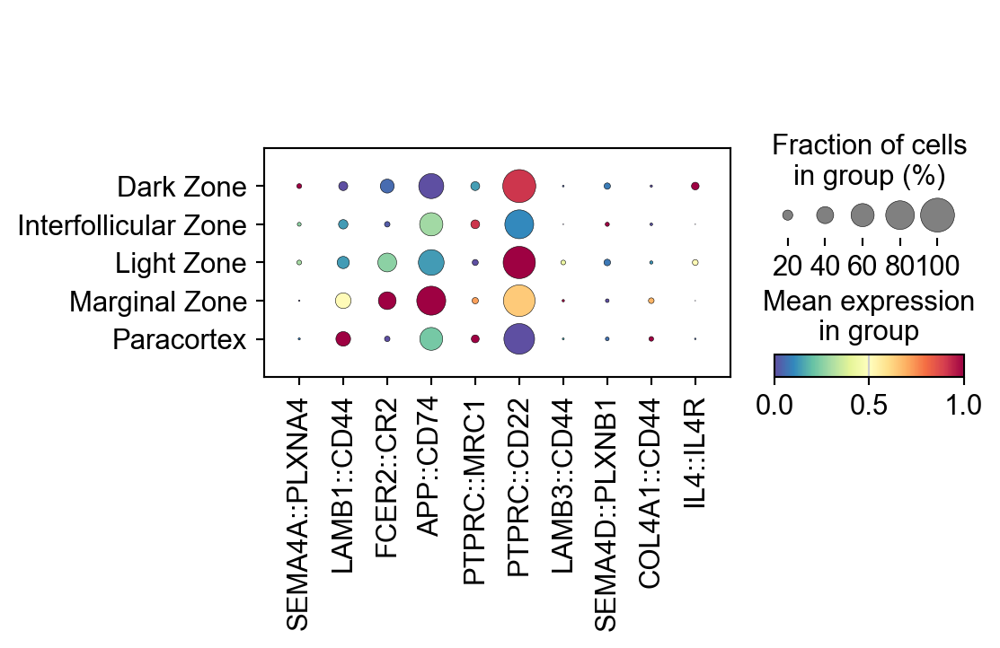

In [23]:
sc.pl.dotplot(lr_adata,
              LARIS_variable_interactions.index[:10],
              groupby='region_name',
             standard_scale='var',
             cmap='Spectral_r')

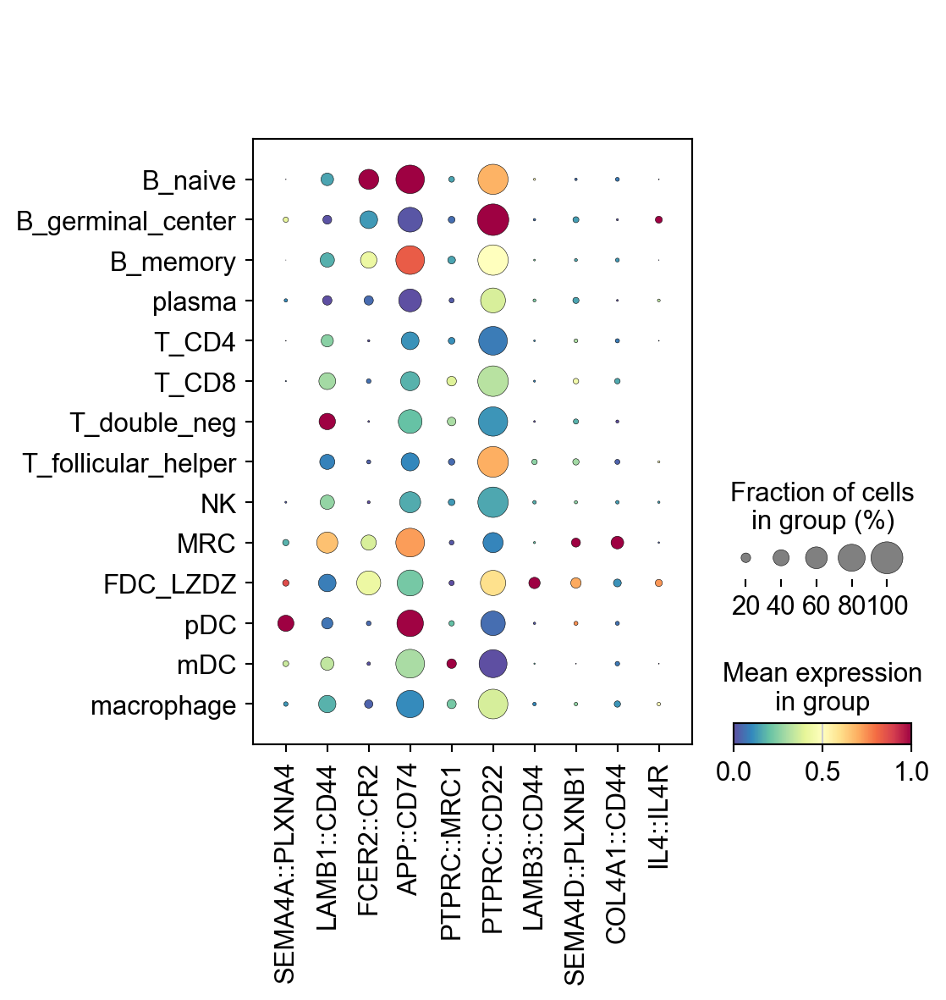

In [24]:
sc.pl.dotplot(lr_adata,
              LARIS_variable_interactions.index[:10],
              groupby='cell_type',
             standard_scale='var',
             cmap='Spectral_r')

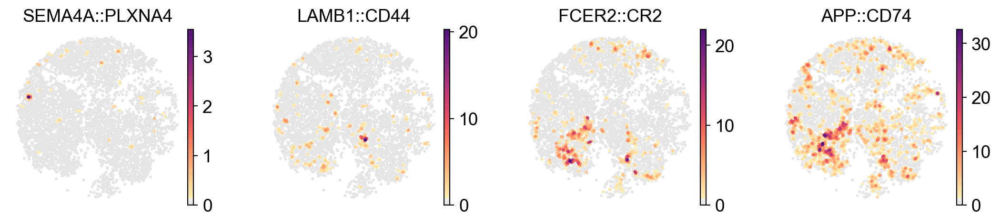

In [25]:
x_width=adata.obsm['X_spatial'][:,0].max()-adata.obsm['X_spatial'][:,0].min()
y_width=adata.obsm['X_spatial'][:,1].max()-adata.obsm['X_spatial'][:,1].min()

plt.rcParams['figure.figsize'] = 2.5, 2.5*y_width/x_width

sc.pl.embedding(
    lr_adata,
    basis='X_spatial',
    color=LARIS_variable_interactions.index[:4],
    cmap=pos_cmap,
 #   vmin=1,
  #  vmax=1.5,
      # palette=self_palette2,
       ncols=4,
    # size=80,
    frameon=False)
plt.rcParams['figure.figsize'] = 4, 4

#### Check the cell type-level ligand-receptor interaction inferred by LARIS

In [26]:
res_LARIS.head(10)

,sender,receiver,interaction_score,ligand,receptor,interaction_name,p_value,p_value_fdr,nlog10_p_value_fdr
0,B_naive,B_naive,0.900057,FCER2,CR2,FCER2::CR2,0.000999,0.010570,1.975922
1,B_memory,B_memory,0.538235,COL4A3,CD44,COL4A3::CD44,0.000999,0.012469,1.904168
2,B_germinal_center,B_germinal_center,0.397066,SEMA4A,PLXNB2,SEMA4A::PLXNB2,0.000999,0.014026,1.853067
3,T_double_neg,NK,0.344916,CLEC2D,KLRB1,CLEC2D::KLRB1,0.000999,0.009419,2.025989
4,B_memory,B_naive,0.337151,COL4A3,CD44,COL4A3::CD44,0.000999,0.012947,1.887830
5,B_memory,B_memory,0.324935,COL4A4,CD44,COL4A4::CD44,0.000999,0.012469,1.904168
6,B_memory,B_memory,0.282586,SEMA7A,PLXNC1,SEMA7A::PLXNC1,0.000999,0.012469,1.904168
7,pDC,B_naive,0.276228,APP,CD74,APP::CD74,0.000999,0.009686,2.013857
8,B_naive,B_naive,0.258380,APP,CD74,APP::CD74,0.033966,0.270686,0.567535
9,B_memory,B_naive,0.244977,APP,CD74,APP::CD74,0.026973,0.292850,0.533355


In [27]:
res_LARIS.head(10)

,sender,receiver,interaction_score,ligand,receptor,interaction_name,p_value,p_value_fdr,nlog10_p_value_fdr
0,B_naive,B_naive,0.900057,FCER2,CR2,FCER2::CR2,0.000999,0.010570,1.975922
1,B_memory,B_memory,0.538235,COL4A3,CD44,COL4A3::CD44,0.000999,0.012469,1.904168
2,B_germinal_center,B_germinal_center,0.397066,SEMA4A,PLXNB2,SEMA4A::PLXNB2,0.000999,0.014026,1.853067
3,T_double_neg,NK,0.344916,CLEC2D,KLRB1,CLEC2D::KLRB1,0.000999,0.009419,2.025989
4,B_memory,B_naive,0.337151,COL4A3,CD44,COL4A3::CD44,0.000999,0.012947,1.887830
5,B_memory,B_memory,0.324935,COL4A4,CD44,COL4A4::CD44,0.000999,0.012469,1.904168
6,B_memory,B_memory,0.282586,SEMA7A,PLXNC1,SEMA7A::PLXNC1,0.000999,0.012469,1.904168
7,pDC,B_naive,0.276228,APP,CD74,APP::CD74,0.000999,0.009686,2.013857
8,B_naive,B_naive,0.258380,APP,CD74,APP::CD74,0.033966,0.270686,0.567535
9,B_memory,B_naive,0.244977,APP,CD74,APP::CD74,0.026973,0.292850,0.533355


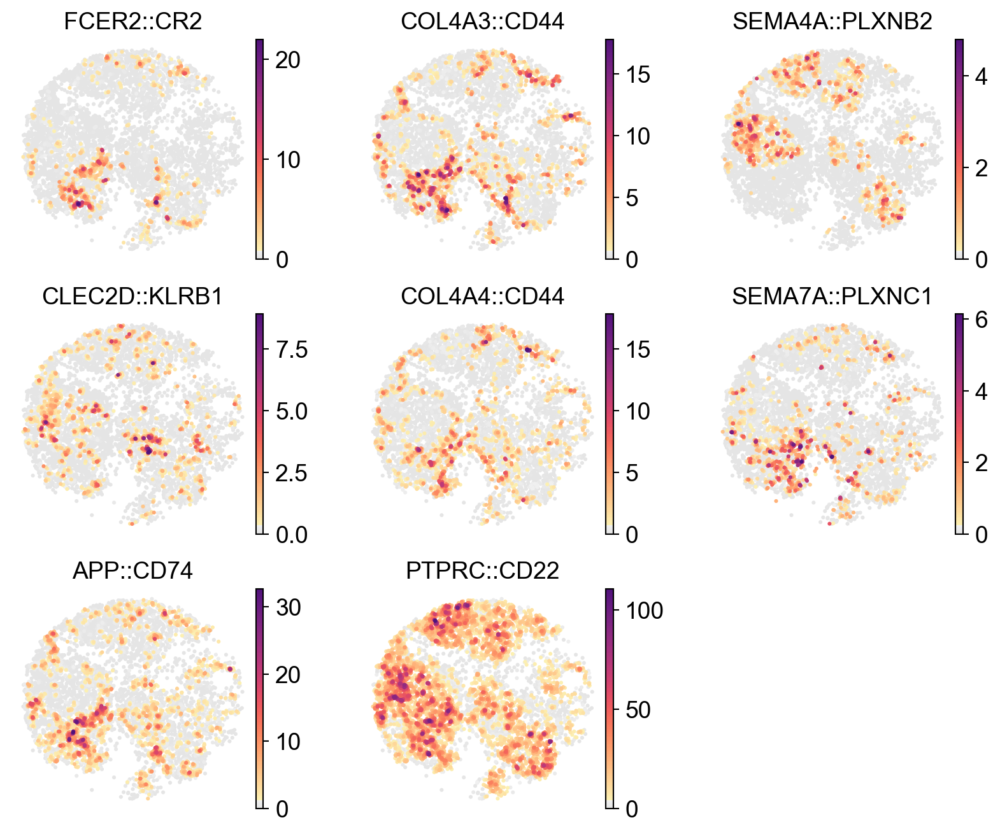

In [28]:
x_width=adata.obsm['X_spatial'][:,0].max()-adata.obsm['X_spatial'][:,0].min()
y_width=adata.obsm['X_spatial'][:,1].max()-adata.obsm['X_spatial'][:,1].min()

plt.rcParams['figure.figsize'] = 2.5, 2.5*y_width/x_width

sc.pl.embedding(
    lr_adata,
    basis='X_spatial',
    color=res_LARIS['interaction_name'][:12].unique(),
    cmap=pos_cmap,
 #   vmin=1,
  #  vmax=1.5,
      # palette=self_palette2,
       ncols=3,
      # size=80,
    frameon=False)
plt.rcParams['figure.figsize'] = 4, 4

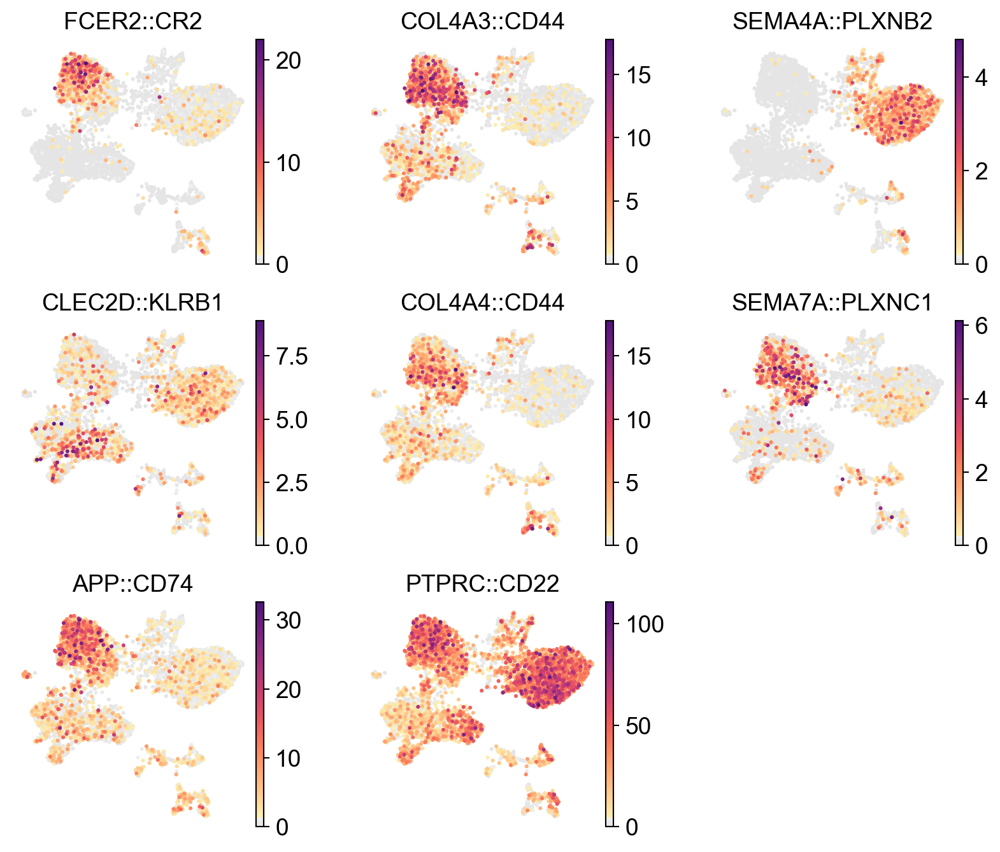

In [29]:
x_width=lr_adata.obsm['X_umap'][:,0].max()-lr_adata.obsm['X_umap'][:,0].min()
y_width=lr_adata.obsm['X_umap'][:,1].max()-lr_adata.obsm['X_umap'][:,1].min()

plt.rcParams['figure.figsize'] = 2.5, 2.5*y_width/x_width

sc.pl.embedding(
    lr_adata,
    basis='X_umap',
    color=res_LARIS['interaction_name'][:12].unique(),
    cmap=pos_cmap,
 #   vmin=1,
  #  vmax=1.5,
      # palette=self_palette2,
       ncols=3,
    # size=50,
    frameon=False)
plt.rcParams['figure.figsize'] = 4, 4

##### Filter hits by ligand/receptor/cell type

In [30]:
res_LARIS[res_LARIS['sender'] == 'MRC'].head(10)

,sender,receiver,interaction_score,ligand,receptor,interaction_name,p_value,p_value_fdr,nlog10_p_value_fdr
17,MRC,T_CD4,0.184022,CCL21,CCR7,CCL21::CCR7,0.000999,0.016983,1.769986
37,MRC,T_CD4,0.137322,CCL19,CCR7,CCL19::CCR7,0.030969,0.324221,0.489159
59,MRC,B_memory,0.098216,COL1A1,CD44,COL1A1::CD44,0.000999,0.013820,1.859508
65,MRC,T_CD4,0.090855,COL1A1,CD44,COL1A1::CD44,0.000999,0.016983,1.769986
71,MRC,T_CD4,0.083999,LAMA4,CD44,LAMA4::CD44,0.028971,0.324221,0.489159
73,MRC,T_double_neg,0.083307,LAMA4,CD44,LAMA4::CD44,0.000999,0.008891,2.051045
84,MRC,B_memory,0.069352,COL1A2,CD44,COL1A2::CD44,0.000999,0.013820,1.859508
90,MRC,T_CD8,0.065867,COL1A2,CD44,COL1A2::CD44,0.000999,0.013362,1.874141
101,MRC,T_CD8,0.056886,LAMA4,CD44,LAMA4::CD44,0.000999,0.013362,1.874141
116,MRC,T_CD4,0.050082,COL1A2,CD44,COL1A2::CD44,0.103896,0.483723,0.315404


#### Look for enrichment in different tissue regions

In [31]:
# Import cosg, could also use a Wilcoxon test as well to find region enrichment
import cosg

In [32]:
adata.obs.head().T

,AAACCCAAGCGCCTTG-1,AAACCCAAGTGGACGT-1,AAACCCACAGAAGTGC-1,AAACCCAGTCATTGCA-1,AAACCCATCATCGCAA-1
n_genes_by_counts,1042,2382,3734,1928,441
log1p_n_genes_by_counts,6.949856,7.776115,8.225503,7.564757,6.09131
total_counts,1495.0,4036.0,7292.0,3039.0,554.0
log1p_total_counts,7.31055,8.303257,8.89467,8.019613,6.318968
pct_counts_in_top_50_genes,18.795987,15.237859,9.421284,13.754525,27.617329
pct_counts_in_top_100_genes,27.826087,21.382557,14.413055,20.500165,38.447653
pct_counts_in_top_200_genes,41.204013,30.401388,21.969281,30.404738,56.498195
pct_counts_in_top_500_genes,63.745819,47.59663,38.137685,50.70747,100.0
total_counts_mt,3.0,8.0,100.0,31.0,2.0
log1p_total_counts_mt,1.386294,2.197225,4.61512,3.465736,1.098612


In [33]:
# Run cosg to identify markers
n_gene=30 # number of genes to save
groupby='region_name'
cosg.cosg(lr_adata,
    key_added='cosg',
    mu=100,
    expressed_pct=0.15, # minimum % of expression to make cut off
    remove_lowly_expressed=True,
    n_genes_user=100, # How many genes to append
    groupby=groupby)

In [34]:
sc.tl.dendrogram(lr_adata, groupby=groupby, use_rep='X_pca')
df_tmp=pd.DataFrame(lr_adata.uns['cosg']['names'][:8,]).T
df_tmp=df_tmp.reindex(lr_adata.uns['dendrogram_'+groupby]['categories_ordered'])
marker_genes_list={idx: list(row.values) for idx, row in df_tmp.iterrows()}
marker_genes_list = {k: v for k, v in marker_genes_list.items() if not any(isinstance(x, float) for x in v)}

Storing dendrogram info using `.uns['dendrogram_region_name']`


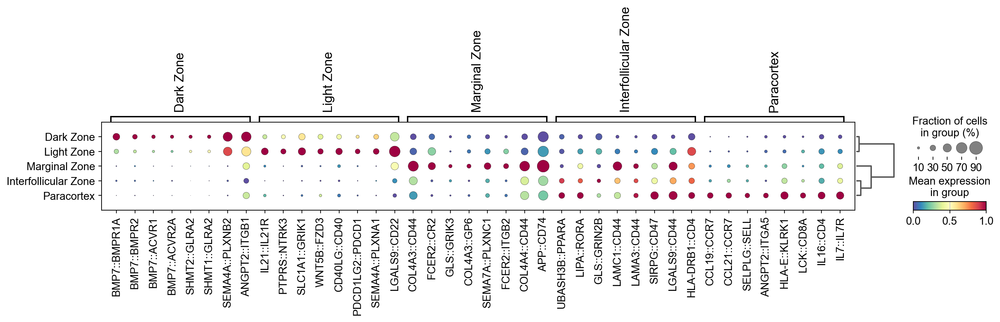

In [35]:
sc.pl.dotplot(lr_adata, marker_genes_list,
             groupby=groupby,
             dendrogram=True,
            swap_axes=False,
             standard_scale='var',
             cmap='Spectral_r')

#### Visualize the ligand-receptor interaction score in spatial plots

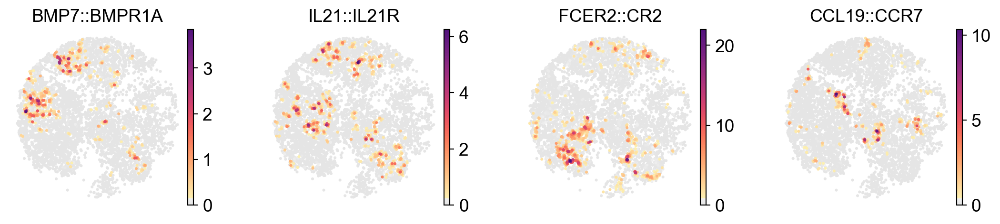

In [36]:
x_width=adata.obsm['X_spatial'][:,0].max()-adata.obsm['X_spatial'][:,0].min()
y_width=adata.obsm['X_spatial'][:,1].max()-adata.obsm['X_spatial'][:,1].min()

plt.rcParams['figure.figsize'] = 2.5, 2.5*y_width/x_width

sc.pl.embedding(
    lr_adata,
    basis='X_spatial',
    color=['BMP7::BMPR1A','IL21::IL21R','FCER2::CR2','CCL19::CCR7'],
    cmap=pos_cmap,
    ncols=4,
    # size=120,
    frameon=False)
plt.rcParams['figure.figsize'] = 4, 4

##### Visualize the ligand-receptor interaction score in UMAP plots

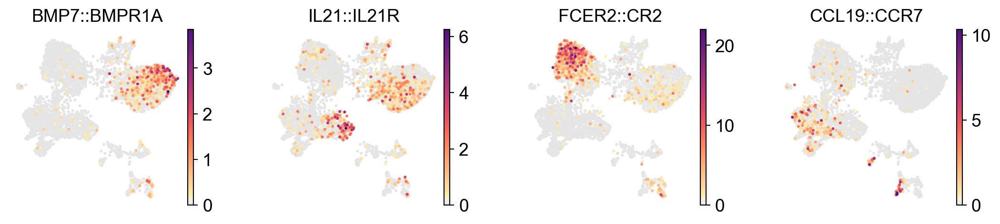

In [37]:
x_width=adata.obsm['X_spatial'][:,0].max()-adata.obsm['X_spatial'][:,0].min()
y_width=adata.obsm['X_spatial'][:,1].max()-adata.obsm['X_spatial'][:,1].min()

plt.rcParams['figure.figsize'] = 2.5, 2.5*y_width/x_width

sc.pl.embedding(
    lr_adata,
    basis='X_umap',
    color=['BMP7::BMPR1A','IL21::IL21R','FCER2::CR2','CCL19::CCR7'],
    cmap=pos_cmap,
    ncols=4,
    # size=60,
    frameon=False)
plt.rcParams['figure.figsize'] = 4, 4

### Visualize LR interaction and cell-cell communication in dfferent ways

#### Cell-cell communication (CCC) Heatmap

First, check the default settings:

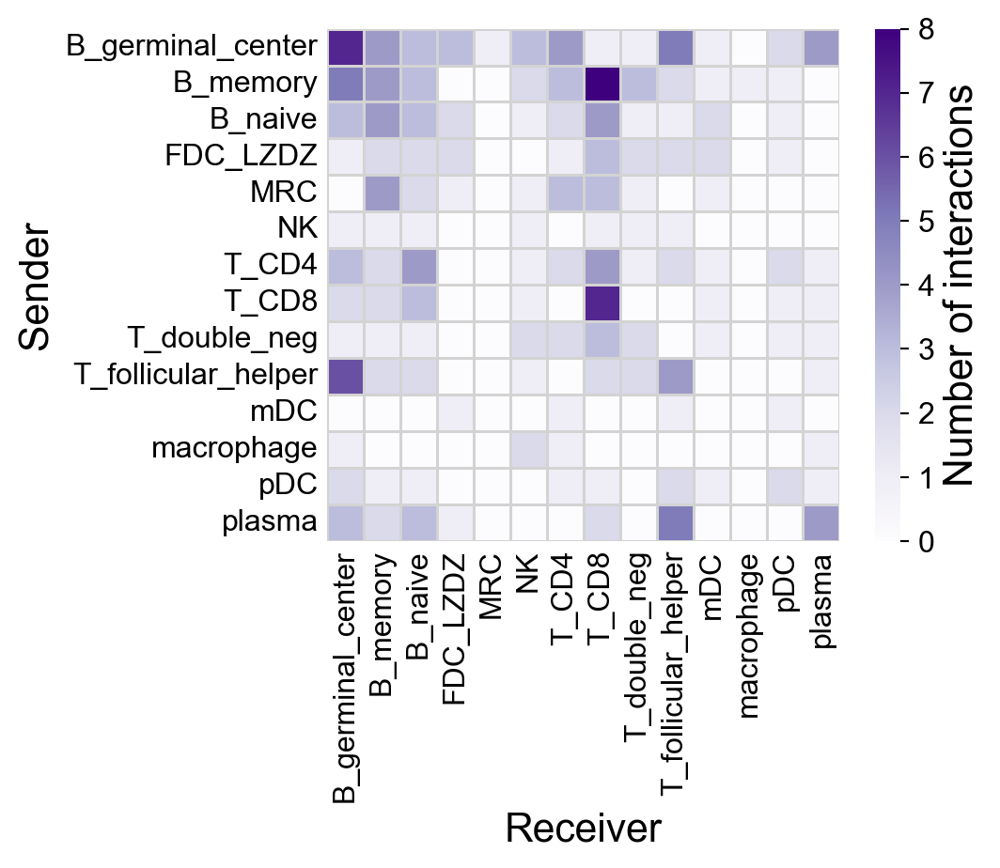

In [38]:
la.pl.plotCCCHeatmap(
    res_LARIS
)

Use the top ones:

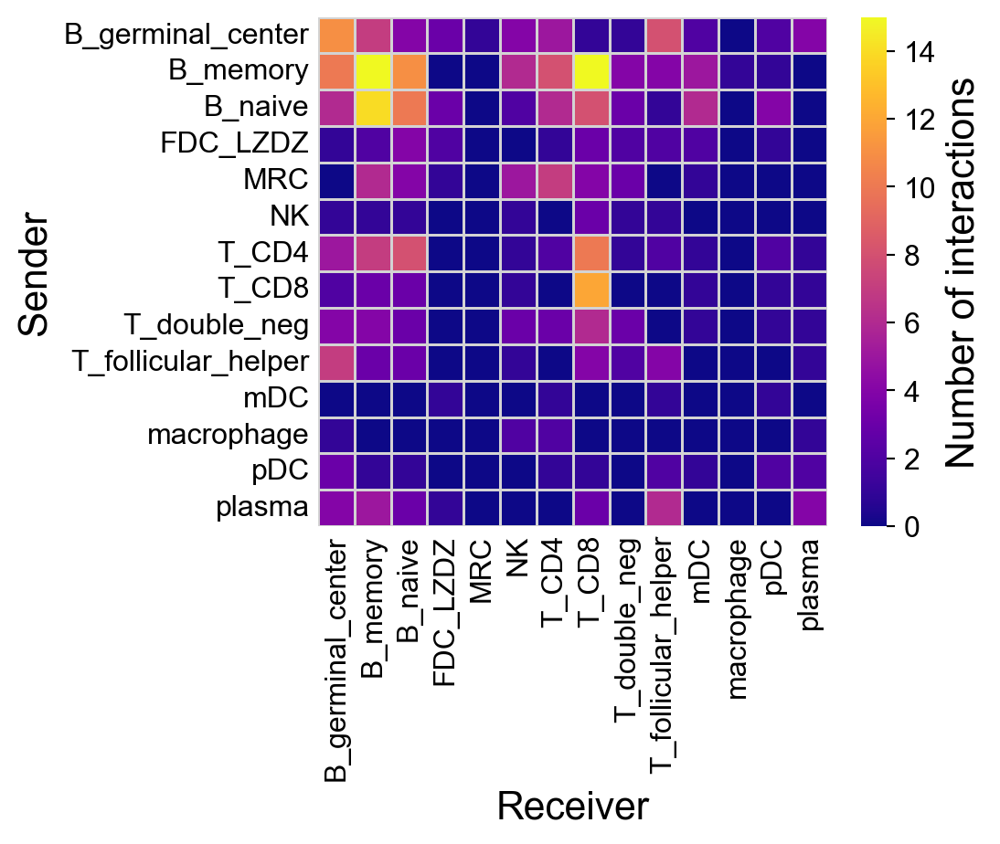

In [39]:
fig=la.pl.plotCCCHeatmap(
    res_LARIS, 
    cmap='plasma', 
    filter_significant=False, 
    n_top=2000, 
)

Filter by the p value and score:

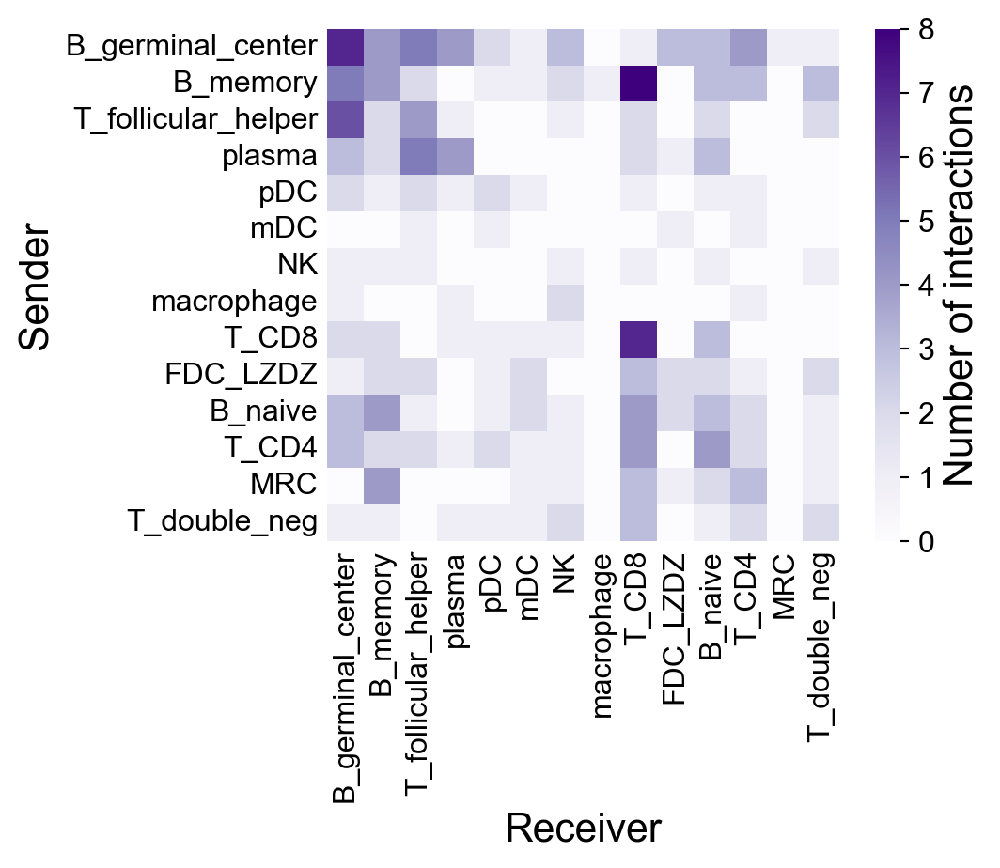

In [40]:
la.pl.plotCCCHeatmap(
    res_LARIS, 
    cmap='Purples', 
    # n_top=2000, 
    figsize=(6, 5),
    axis_label_fontsize=16,
    tick_fontsize=12,
    cbar_label_fontsize=16,
    cbar_tick_fontsize=12,
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    show_borders=False,
    cluster=True,
)

Change the threshold:

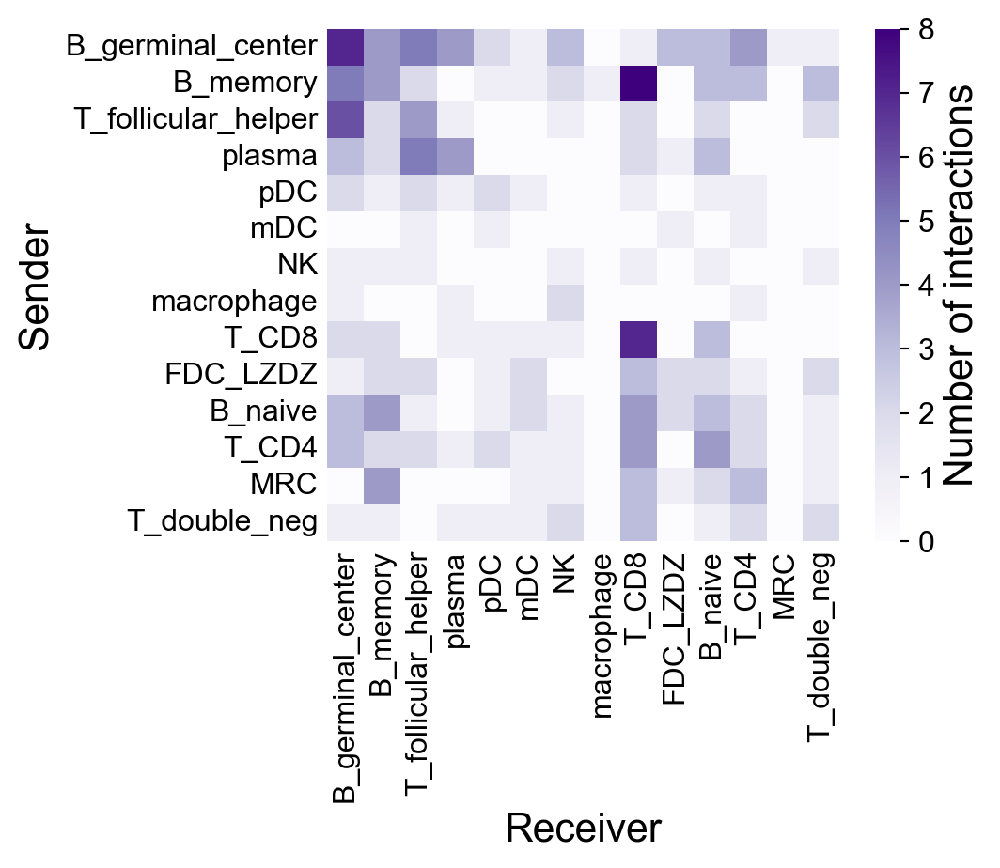

In [41]:
la.pl.plotCCCHeatmap(
    res_LARIS, 
    cmap='Purples', 
    # n_top=2000, 
    figsize=(6, 5),
    axis_label_fontsize=16,
    tick_fontsize=12,
    cbar_label_fontsize=16,
    cbar_tick_fontsize=12,
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.1,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    show_borders=False,
    cluster=True,
)

### CCC Network

First, check the default settings:

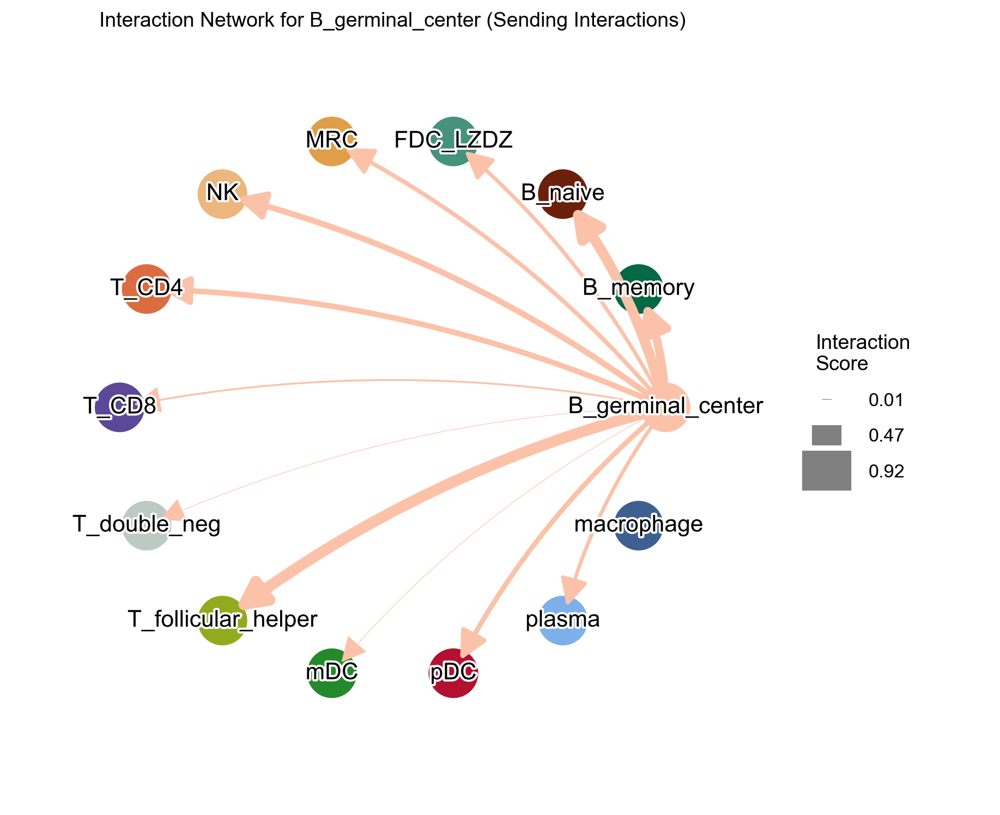

In [42]:
la.pl.plotCCCNetwork(
    res_LARIS,
    'B_germinal_center',
    interaction_direction='sending',
    adata=adata,
)

Check the receiving pattern for a target cell type:

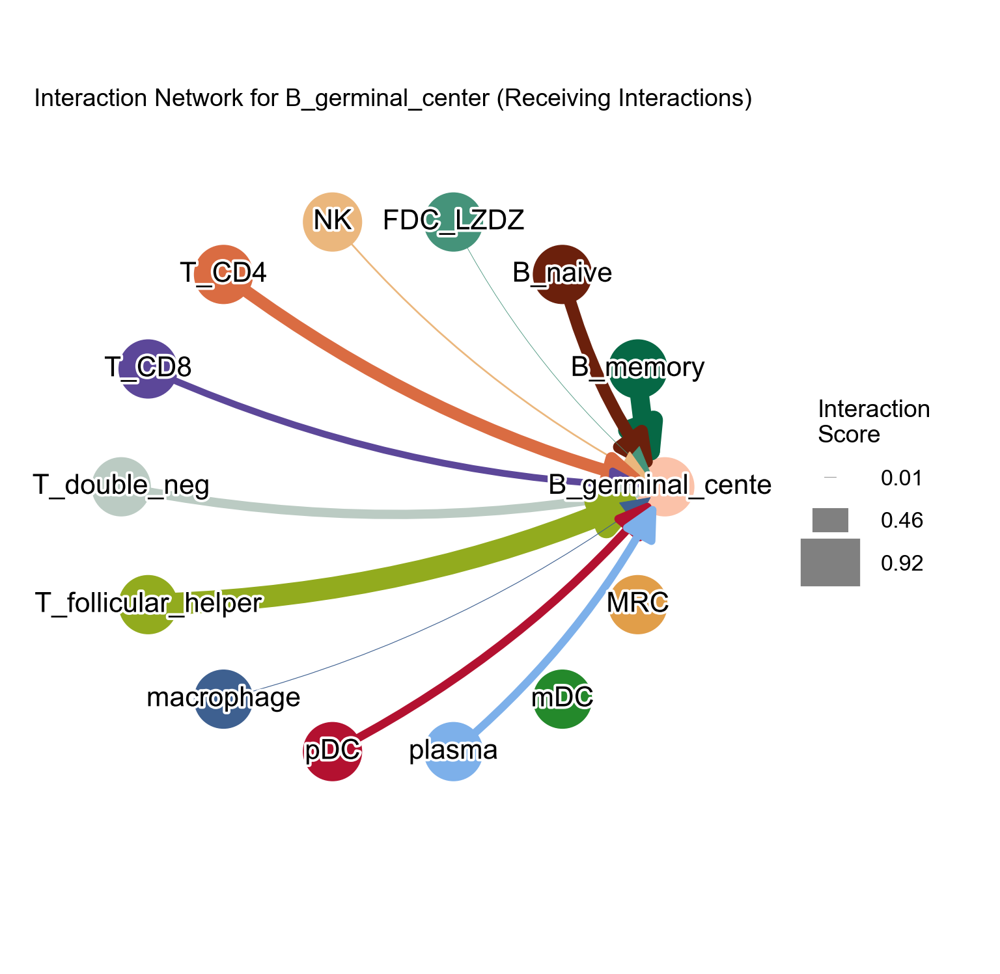

In [43]:
la.pl.plotCCCNetwork(
    res_LARIS,
    'B_germinal_center',
    interaction_direction='receiving',
    adata=adata,
    # edge_width_scale=20,
    # n_top=3000,
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    figsize=[10, 10],
)

Adjust the `edge_with_scale` parameter and `figsize` parameter:

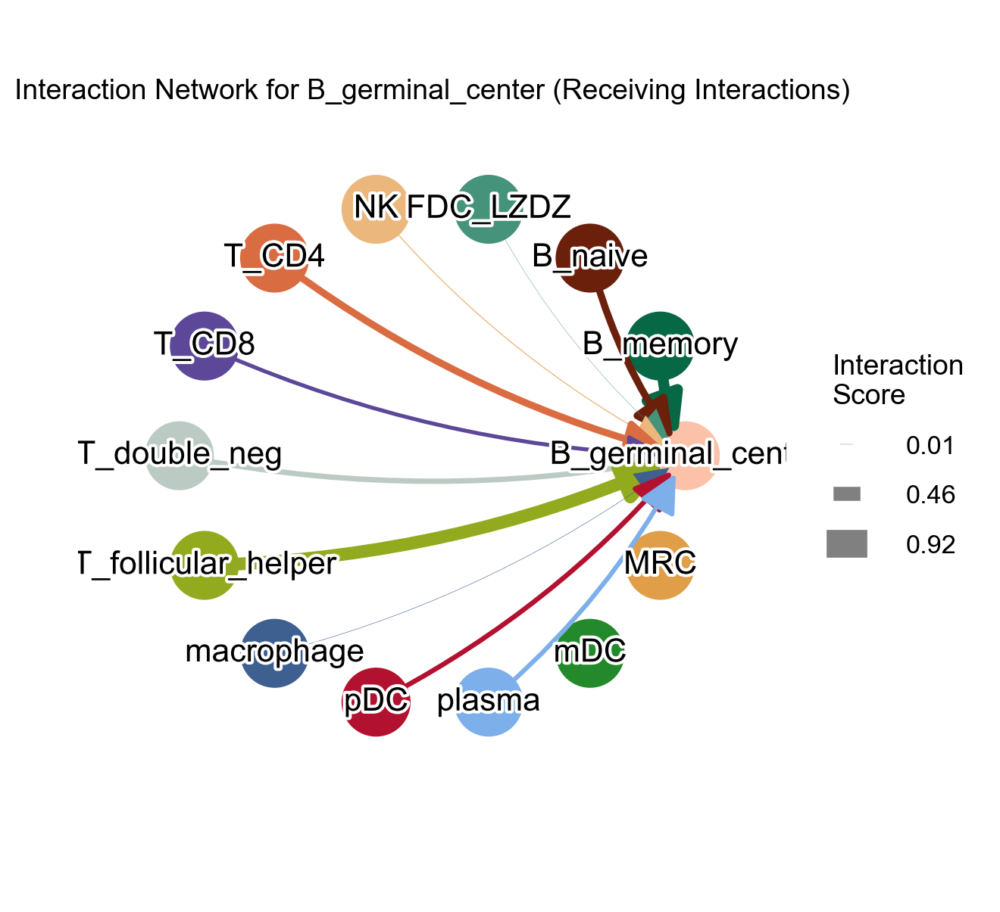

In [44]:
la.pl.plotCCCNetwork(
    res_LARIS,
    'B_germinal_center',
    interaction_direction='receiving',
    adata=adata,
    edge_width_scale=15,
    # n_top=3000,
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    figsize=[8, 8],
)

#### CCC Network (cumulative)

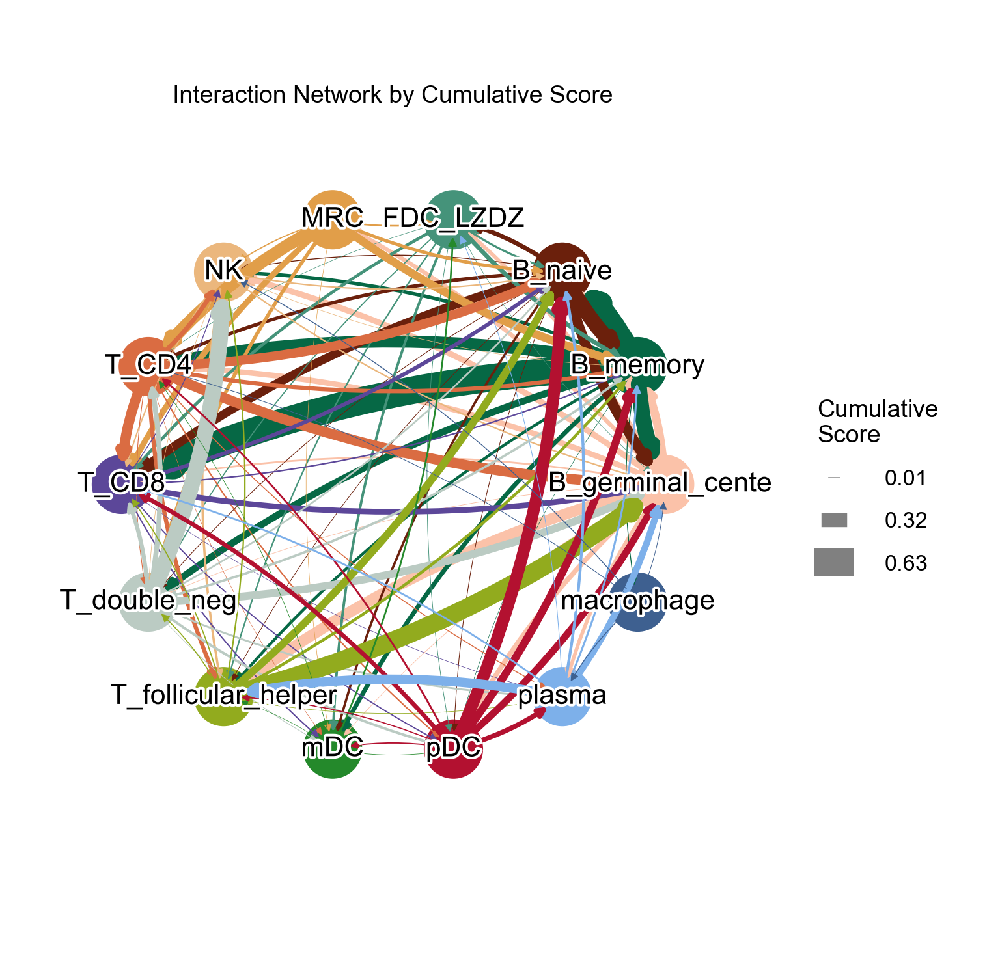

In [45]:
la.pl.plotCCCNetworkCumulative(
    res_LARIS,
    adata=adata,
    groupby='cell_type',
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    edge_width_scale=25,
    figsize=[10, 10],
    
)

Add `cutoff = 0.1` to filter out some edges:

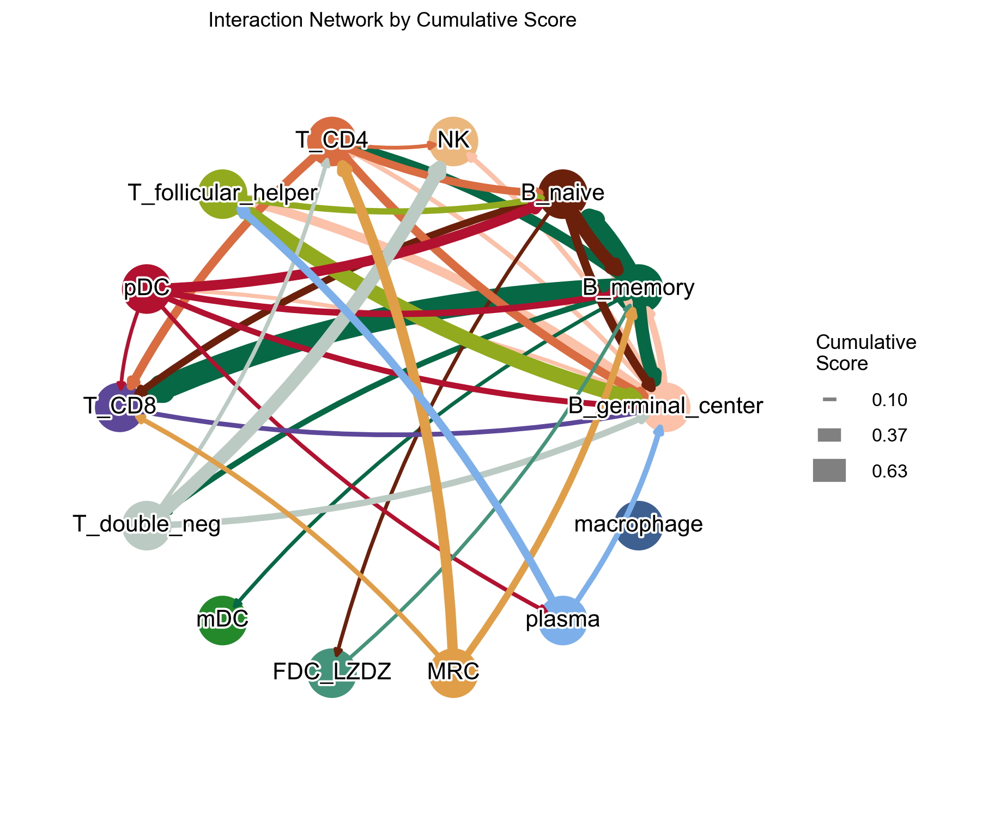

In [46]:
la.pl.plotCCCNetworkCumulative(
    res_LARIS,
    adata=adata,
    groupby='cell_type',
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    edge_width_scale=25,
    # figsize=[6, 6],
    cutoff=0.1,
    
)

### CCC DotPlot

First, check the default:

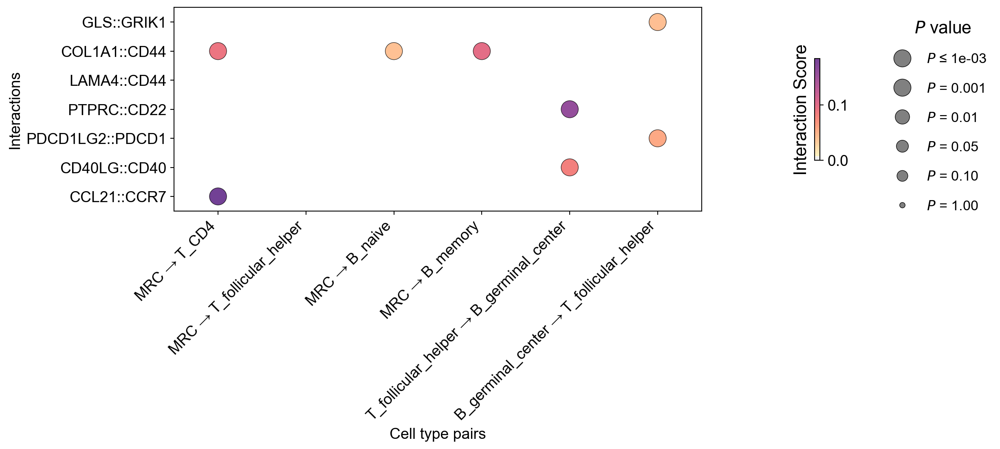

In [47]:
la.pl.plotCCCDotPlot(
    res_LARIS,
    interactions_to_plot=['CCL21::CCR7', "CD40LG::CD40",  "PDCD1LG2::PDCD1", "PTPRC::CD22", "LAMA4::CD44",
                        "COL1A1::CD44",
                        "GLS::GRIK1"],
    senders=["MRC", "MRC", "MRC", "MRC", "T_follicular_helper", "B_germinal_center"],
    receivers=["T_CD4", "T_follicular_helper", "B_naive", "B_memory",  "B_germinal_center",'T_follicular_helper'],
)

Adjust paramters for `figsize` and `cmap`:

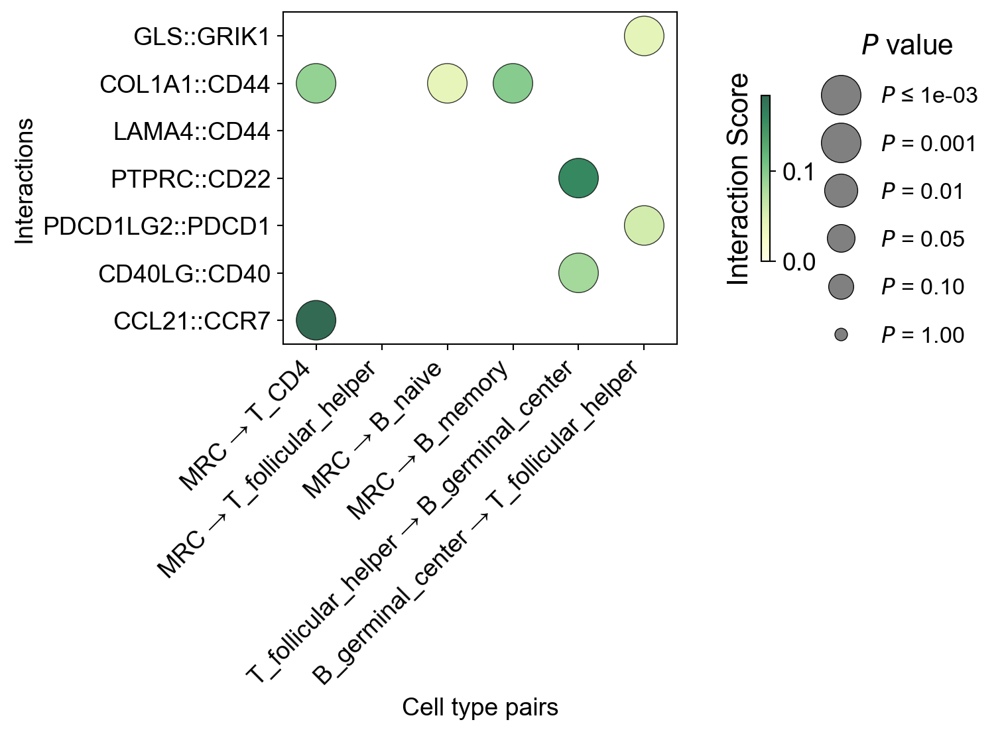

In [48]:
la.pl.plotCCCDotPlot(
    res_LARIS,
    interactions_to_plot=['CCL21::CCR7', "CD40LG::CD40",  "PDCD1LG2::PDCD1", "PTPRC::CD22", "LAMA4::CD44",
                        "COL1A1::CD44",
                        "GLS::GRIK1"],
    senders=["MRC", "MRC", "MRC", "MRC", "T_follicular_helper", "B_germinal_center"],
    receivers=["T_CD4", "T_follicular_helper", "B_naive", "B_memory",  "B_germinal_center",'T_follicular_helper'],
    
    # n_top=3000,
    bubble_size=500,
    cmap='YlGn',
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    figsize=[8,6],
    show_grid=False,
)

Adjust the `show_grid = True` parameter:

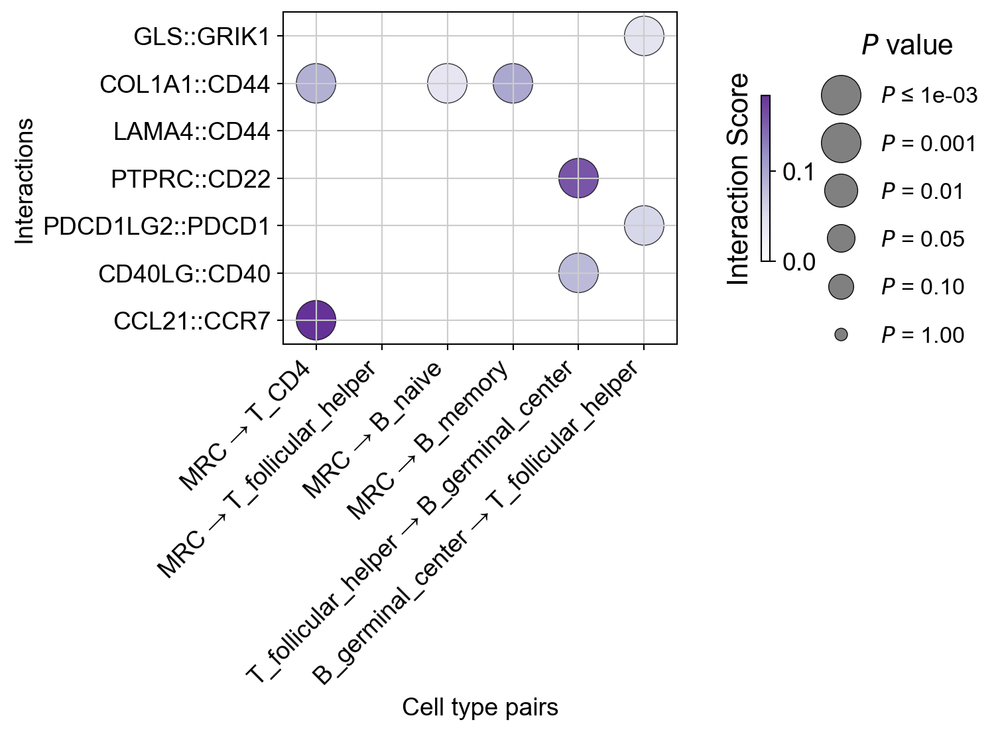

In [49]:
la.pl.plotCCCDotPlot(
    res_LARIS,
    interactions_to_plot=['CCL21::CCR7', "CD40LG::CD40",  "PDCD1LG2::PDCD1", "PTPRC::CD22", "LAMA4::CD44",
                        "COL1A1::CD44",
                        "GLS::GRIK1"],
    senders=["MRC", "MRC", "MRC", "MRC", "T_follicular_helper", "B_germinal_center"],
    receivers=["T_CD4", "T_follicular_helper", "B_naive", "B_memory",  "B_germinal_center",'T_follicular_helper'],

    
    bubble_size=500,
    cmap='Purples',
    # filter_significant=False,
    # n_top=3000,
    filter_significant=True,
    p_value_col='p_value_fdr',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    figsize=[8,6],
    show_grid=True,
)

In [50]:
res_LARIS.head(30)

,sender,receiver,interaction_score,ligand,receptor,interaction_name,p_value,p_value_fdr,nlog10_p_value_fdr
0,B_naive,B_naive,0.900057,FCER2,CR2,FCER2::CR2,0.000999,0.010570,1.975922
1,B_memory,B_memory,0.538235,COL4A3,CD44,COL4A3::CD44,0.000999,0.012469,1.904168
2,B_germinal_center,B_germinal_center,0.397066,SEMA4A,PLXNB2,SEMA4A::PLXNB2,0.000999,0.014026,1.853067
3,T_double_neg,NK,0.344916,CLEC2D,KLRB1,CLEC2D::KLRB1,0.000999,0.009419,2.025989
4,B_memory,B_naive,0.337151,COL4A3,CD44,COL4A3::CD44,0.000999,0.012947,1.887830
5,B_memory,B_memory,0.324935,COL4A4,CD44,COL4A4::CD44,0.000999,0.012469,1.904168
6,B_memory,B_memory,0.282586,SEMA7A,PLXNC1,SEMA7A::PLXNC1,0.000999,0.012469,1.904168
7,pDC,B_naive,0.276228,APP,CD74,APP::CD74,0.000999,0.009686,2.013857
8,B_naive,B_naive,0.258380,APP,CD74,APP::CD74,0.033966,0.270686,0.567535
9,B_memory,B_naive,0.244977,APP,CD74,APP::CD74,0.026973,0.292850,0.533355


In [51]:
res_LARIS[res_LARIS['sender']=='FDC_LZDZ']

,sender,receiver,interaction_score,ligand,receptor,interaction_name,p_value,p_value_fdr,nlog10_p_value_fdr
109,FDC_LZDZ,B_memory,0.054153,FN1,ITGA4,FN1::ITGA4,0.000999,0.013291,1.876441
124,FDC_LZDZ,B_memory,0.046145,FN1,CD44,FN1::CD44,0.000999,0.013291,1.876441
135,FDC_LZDZ,mDC,0.043458,FN1,ITGA4,FN1::ITGA4,0.000999,0.007473,2.126533
149,FDC_LZDZ,FDC_LZDZ,0.039254,SLC1A2,GRIA3,SLC1A2::GRIA3,0.000999,0.012916,1.888884
151,FDC_LZDZ,T_CD8,0.038067,FN1,CD44,FN1::CD44,0.000999,0.011748,1.930027
...,...,...,...,...,...,...,...,...,...
389053,FDC_LZDZ,FDC_LZDZ,0.000000,NRG2,ERBB4,NRG2::ERBB4,1.000000,1.000000,0.000000
389054,FDC_LZDZ,FDC_LZDZ,0.000000,LAMC2,ITGB4,LAMC2::ITGB4,1.000000,1.000000,0.000000
389055,FDC_LZDZ,FDC_LZDZ,0.000000,NRG1,ITGB4,NRG1::ITGB4,1.000000,1.000000,0.000000
389056,FDC_LZDZ,FDC_LZDZ,0.000000,NRG3,ERBB4,NRG3::ERBB4,1.000000,1.000000,0.000000


### CCC DotPlot (Facet)

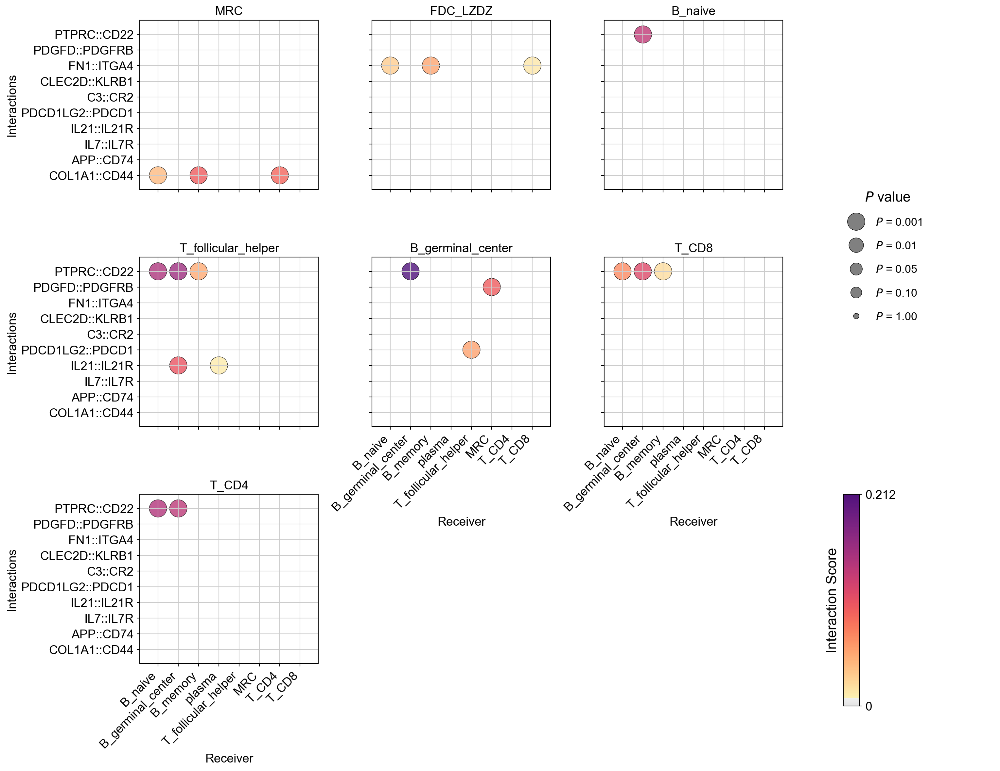

In [52]:
la.pl.plotCCCDotPlotFacet(
    res_LARIS,
    senders=["MRC", "FDC_LZDZ", "B_naive", 'T_follicular_helper','B_germinal_center', 'T_CD8', 'T_CD4'],
    receivers=[
        "B_naive",
        "B_germinal_center",
        "B_memory",
        "plasma", 
        'T_follicular_helper',
        'MRC',
        'T_CD4',
        'T_CD8'
        
    ],
    interactions_to_plot=[
        "COL1A1::CD44",
        'APP::CD74',
        "IL7::IL7R",
        "IL21::IL21R",
        'PDCD1LG2::PDCD1', 
        "C3::CR2",  "CLEC2D::KLRB1",
        'FN1::ITGA4',
        'PDGFD::PDGFRB','PTPRC::CD22', ],
)

Use top ones, no filtering on P values or scores:

No filters applied. Using top 3000 interactions.


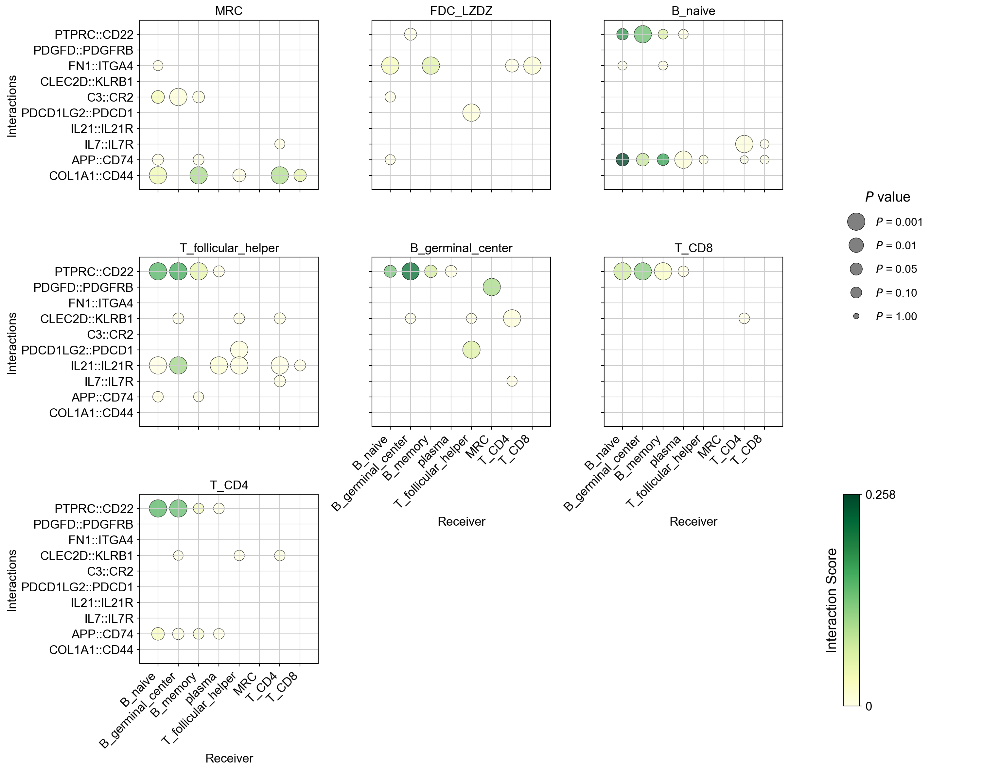

In [53]:
la.pl.plotCCCDotPlotFacet(
    res_LARIS,
    senders=["MRC", "FDC_LZDZ", "B_naive", 'T_follicular_helper','B_germinal_center', 'T_CD8', 'T_CD4'],
    receivers=[
        "B_naive",
        "B_germinal_center",
        "B_memory",
        "plasma", 
        'T_follicular_helper',
        'MRC',
        'T_CD4',
        'T_CD8'
        
    ],
    interactions_to_plot=[
        "COL1A1::CD44",
        'APP::CD74',
        "IL7::IL7R",
        "IL21::IL21R",
        'PDCD1LG2::PDCD1', 
        "C3::CR2",  "CLEC2D::KLRB1",
        'FN1::ITGA4',
        'PDGFD::PDGFRB','PTPRC::CD22', ],
    
    cmap='YlGn',
    
    filter_significant=False, filter_by_interaction_score=False, n_top=3000,

    # filter_significant=True, filter_by_interaction_score=True,
    p_value_col='p_value',
    threshold=0.05,
    threshold_interaction_score=0.01,
    # ncol=6,
)

Change the `ncol` to control the number of columns, and also turn off the grid lines by `show_grid = False`:

No filters applied. Using top 3000 interactions.


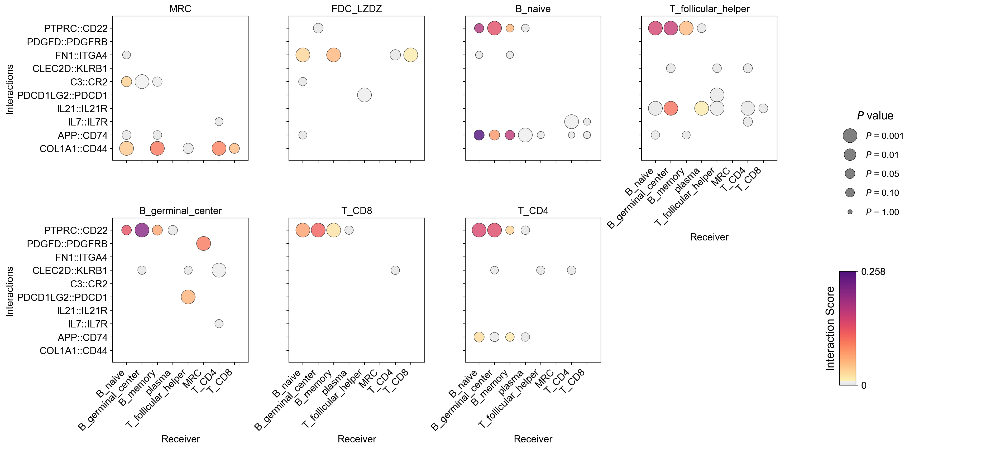

In [54]:
la.pl.plotCCCDotPlotFacet(
    res_LARIS,
    senders=["MRC", "FDC_LZDZ", "B_naive", 'T_follicular_helper','B_germinal_center', 'T_CD8', 'T_CD4'],
    receivers=[
        "B_naive",
        "B_germinal_center",
        "B_memory",
        "plasma", 
        'T_follicular_helper',
        'MRC',
        'T_CD4',
        'T_CD8'
        
    ],
    interactions_to_plot=[
        "COL1A1::CD44",
        'APP::CD74',
        "IL7::IL7R",
        "IL21::IL21R",
        'PDCD1LG2::PDCD1', 
        "C3::CR2",  "CLEC2D::KLRB1",
        'FN1::ITGA4',
        'PDGFD::PDGFRB','PTPRC::CD22', ],

    
    cmap=pos_cmap,    
    
    filter_significant=False, filter_by_interaction_score=False, n_top=3000,

    # filter_significant=True, filter_by_interaction_score=True,
    p_value_col='p_value',
    threshold=0.05,
    threshold_interaction_score=0.01,
    ncol=4,
    show_grid = False
)

#### CCC DotPlot (Facet), facet by receiver

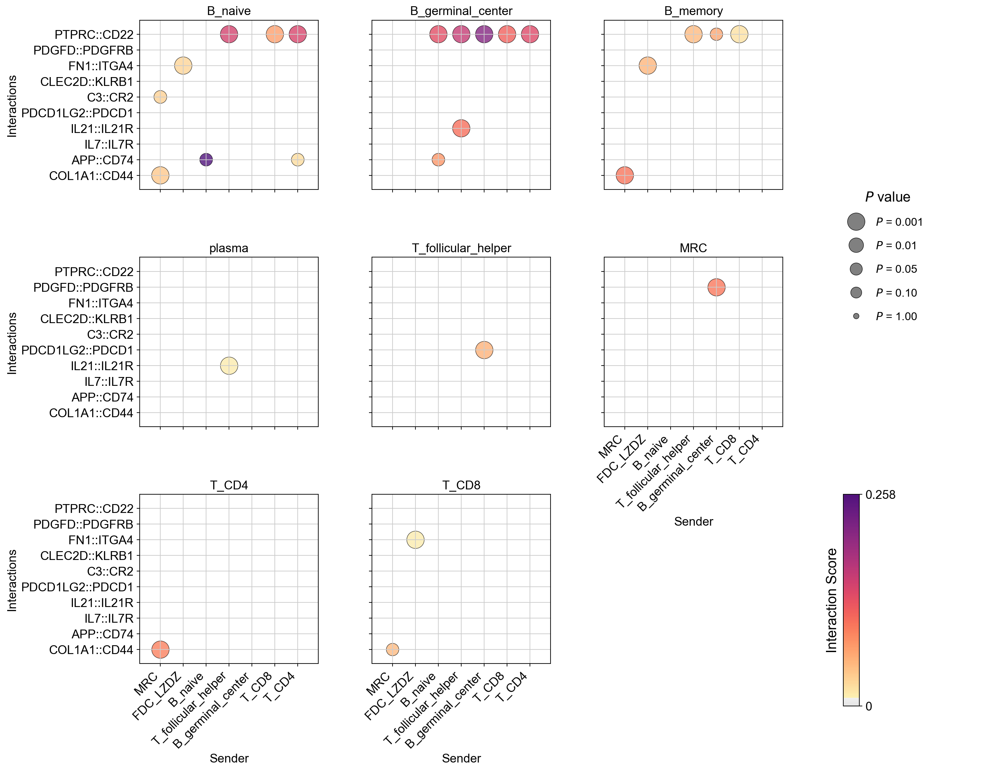

In [55]:
la.pl.plotCCCDotPlotFacet(
    res_LARIS,
    facet_by='receiver',
    senders=["MRC", "FDC_LZDZ", "B_naive", 'T_follicular_helper','B_germinal_center', 'T_CD8', 'T_CD4'],
    receivers=[
        "B_naive",
        "B_germinal_center",
        "B_memory",
        "plasma", 
        'T_follicular_helper',
        'MRC',
        'T_CD4',
        'T_CD8'
        
    ],
    interactions_to_plot=[
        "COL1A1::CD44",
        'APP::CD74',
        "IL7::IL7R",
        "IL21::IL21R",
        'PDCD1LG2::PDCD1', 
        "C3::CR2",  "CLEC2D::KLRB1",
        'FN1::ITGA4',
        'PDGFD::PDGFRB','PTPRC::CD22', ],

    
    cmap=pos_cmap,    
    # filter_significant=False, n_top=3000,

    filter_significant=True,
    p_value_col='p_value',
    threshold=0.05,
    filter_by_interaction_score=True,
    threshold_interaction_score=0.01,
    ncol=3,
)

### Create combined object with LR scores and gene expression combined

In [56]:
adata_dotplot = la.pl.prepareDotPlotAdata(lr_adata, adata)

Created combined AnnData: 5695 cells × 27568 features


##### Plot LR scores, Ligand expression, and Receptor expression seperately for each interaction (Dot plot)

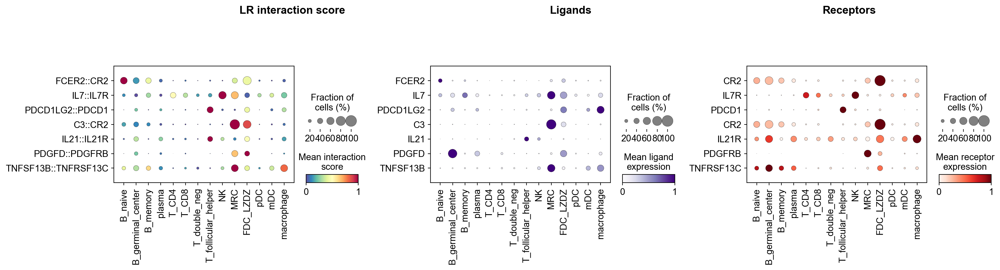

In [57]:
la.pl.plotLRDotPlot(
    adata_dotplot, 
    ["FCER2::CR2", "IL7::IL7R", 'PDCD1LG2::PDCD1', "C3::CR2", "IL21::IL21R",'PDGFD::PDGFRB','TNFSF13B::TNFRSF13C'],
    groupby='cell_type',
    cmap_interaction='Spectral_r',
    cmap_ligand='Purples',
    cmap_receptor='Reds',
    figsize=[18, 5], 
)

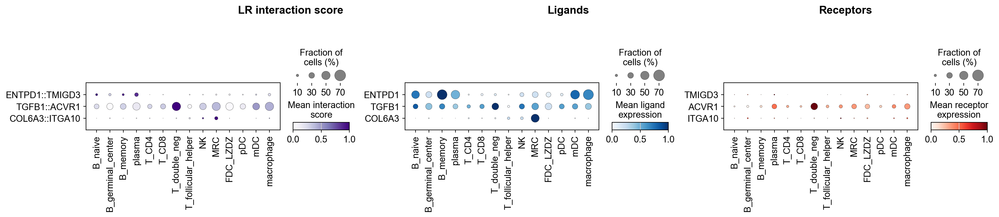

In [58]:
la.pl.plotLRDotPlot(
    adata_dotplot, 
    ['ENTPD1::TMIGD3', 'TGFB1::ACVR1', 'COL6A3::ITGA10'],
    groupby='cell_type',
    cmap_interaction='Purples',
    cmap_ligand='Blues',
    cmap_receptor='Reds',
    figsize=[18, 4], 
)

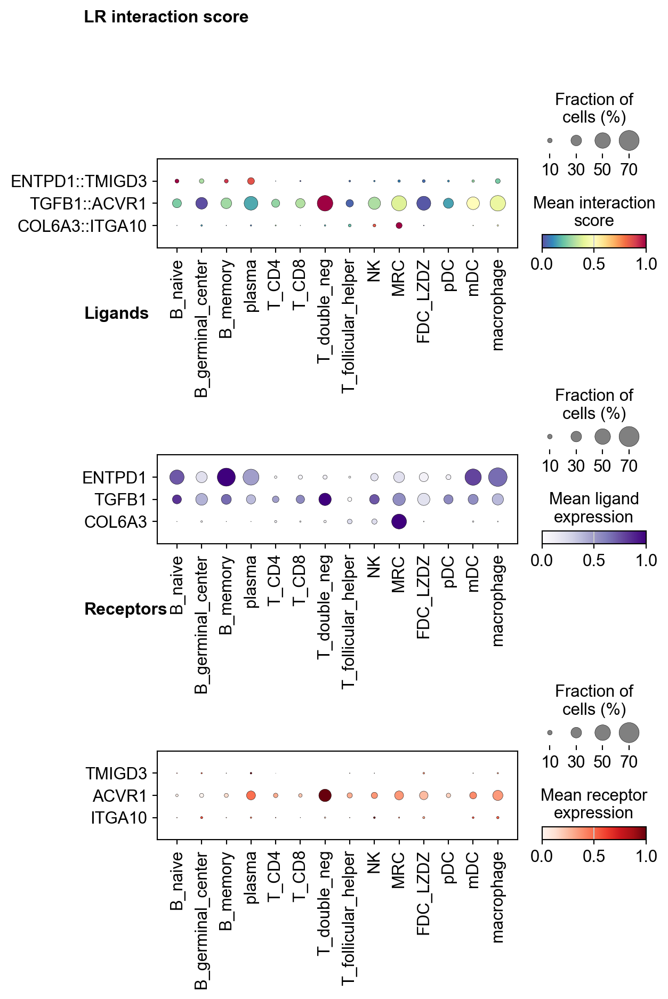

In [59]:
la.pl.plotLRDotPlot(
    adata_dotplot, 
    ['ENTPD1::TMIGD3', 'TGFB1::ACVR1', 'COL6A3::ITGA10'],
    groupby='cell_type',
    cmap_interaction='Spectral_r',
    cmap_ligand='Purples',
    cmap_receptor='Reds',
    figsize=[6, 10], 
    orientation='vertical'
)

### Spatial plot of participating cells for an interaction

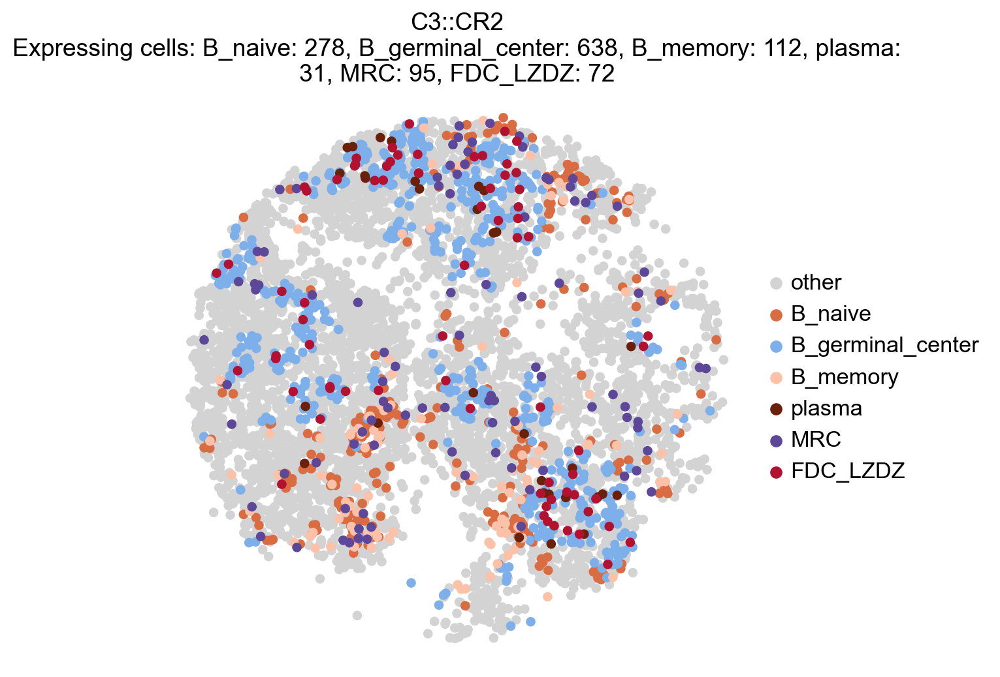

In [60]:
# Plot selected cells that have an interaction score for a certain interaction ((participating in an interaction))
la.pl.plotCCCSpatial(
    lr_adata=lr_adata,
    basis="X_spatial",
    interaction='C3::CR2',
    cell_type="cell_type",
    selected_cell_types=['B_naive', 'B_germinal_center','B_memory','plasma','MRC','FDC_LZDZ'],
    background_color='lightgrey',
    colors=['#da6c42','#7db0ea','#fbc2a9','#6b200c','#5c4799','#b31130'],  # ['#d53e4f','#fdae61','#3288bd','#3288bd','#3288bd','#3288bd','#3288bd']
    size=120,
    fig_width=6,
)

#### Spatial plot of participating cells for an interaction, all cells

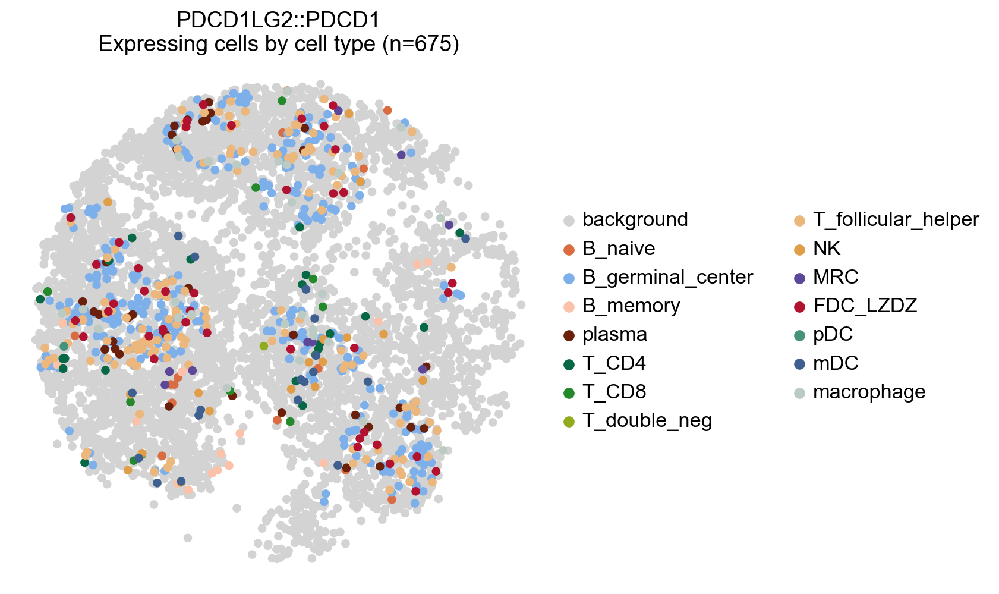

In [61]:
# Plot any cell that has an interaction score for a cetrain LR pair (participating in an interaction)
lr_adata.uns['cell_type_colors'] = adata.uns['cell_type_colors'].copy()
# Highlight all expressing cells with original colors by setting `highlight_all_expressing=True`
la.pl.plotCCCSpatial(
    lr_adata,
    basis='X_spatial',
    interaction='PDCD1LG2::PDCD1',
    cell_type='cell_type',
    background_color='lightgrey',
    highlight_all_expressing=True,
    size=120,
    fig_width=6,
)

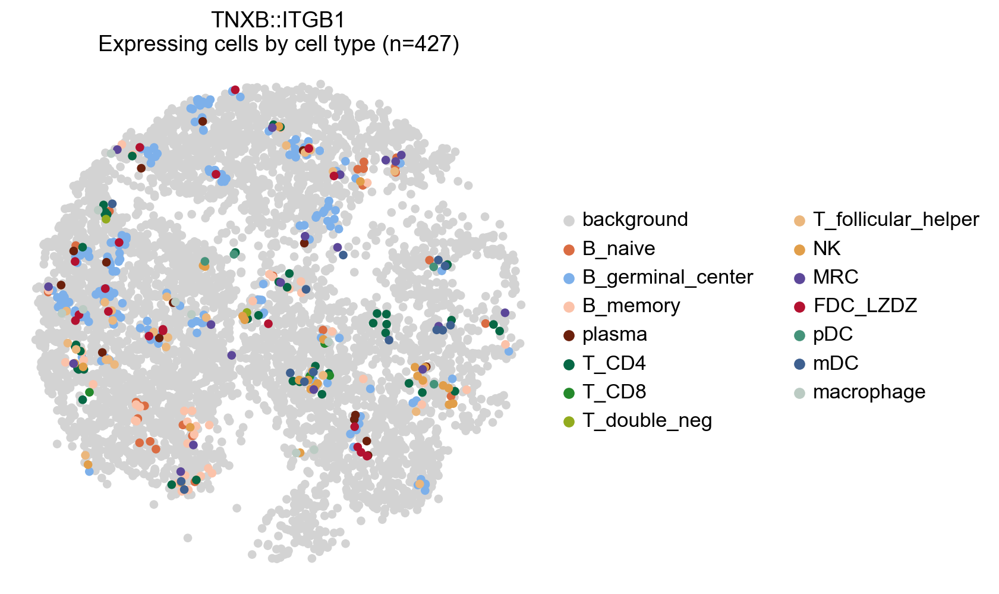

In [62]:
# Plot any cell that has an interaction score for a cetrain LR pair (participating in an interaction)
lr_adata.uns['cell_type_colors'] = adata.uns['cell_type_colors'].copy()
# Highlight all expressing cells with original colors by setting `highlight_all_expressing=True`
la.pl.plotCCCSpatial(
    lr_adata,
    basis='X_spatial',
    interaction='TNXB::ITGB1',
    cell_type='cell_type',
    background_color='lightgrey',
    highlight_all_expressing=True,
    size=120,
    fig_width=6,
)

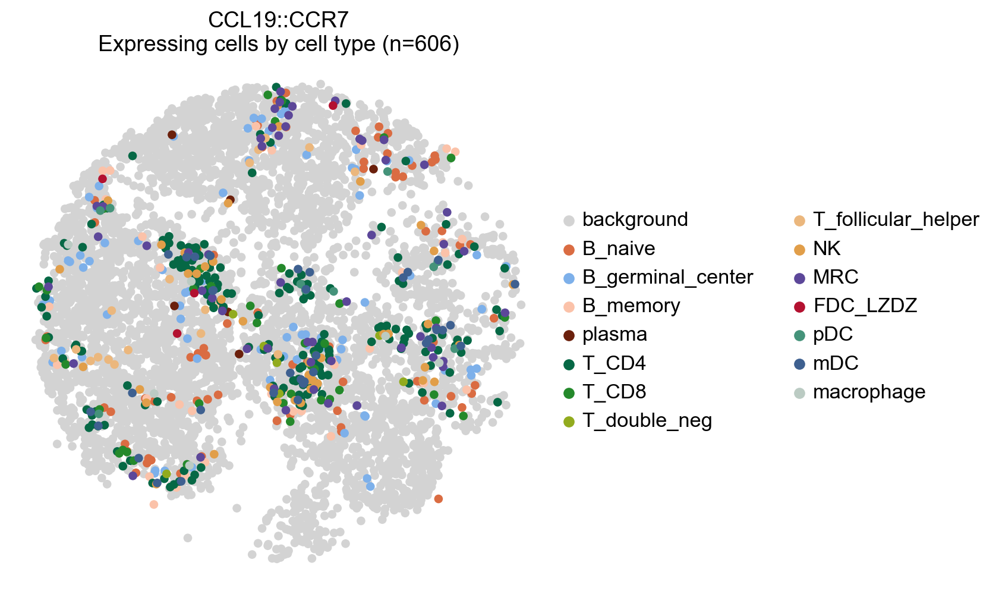

In [63]:
# Plot any cell that has an interaction score for a cetrain LR pair (participating in an interaction)
lr_adata.uns['cell_type_colors'] = adata.uns['cell_type_colors'].copy()
# Highlight all expressing cells with original colors by setting `highlight_all_expressing=True`
la.pl.plotCCCSpatial(
    lr_adata,
    basis='X_spatial',
    interaction='CCL19::CCR7',
    cell_type='cell_type',
    background_color='lightgrey',
    highlight_all_expressing=True,
    size=120,
    fig_width=6,
)

### Save the plot

To save the plot, please use the `save` parameter in each plotting function within LARIS:

Figure saved to: ./LARIS_ccc_heatmap.pdf


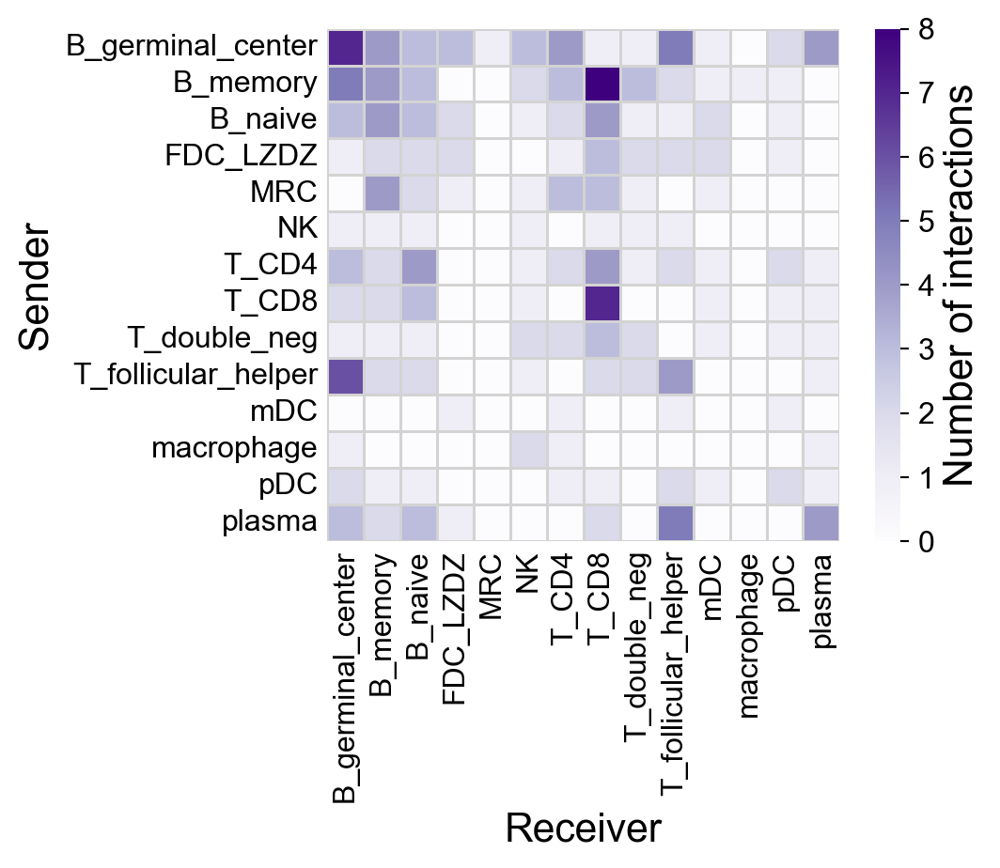

In [64]:
la.pl.plotCCCHeatmap(
    res_LARIS,
    save='./LARIS_ccc_heatmap.pdf'
)